In [1]:
# import the required packages
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import warnings
warnings.filterwarnings('ignore')

# 1. Build Clustering Models using Numerical Data

## 1.1 Data exploration and manipulation

In [2]:
df= pd.read_csv('Bank_Data.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Account Status                                            1000 non-null   object
 1   Duration in month                                         1000 non-null   int64 
 2   Credit History                                            1000 non-null   object
 3   Purpose                                                   1000 non-null   object
 4   Credit amount                                             1000 non-null   int64 
 5   Savings account or bonds                                  1000 non-null   object
 6   Present employment since                                  1000 non-null   object
 7   Instalment rate in percentage of disposable income        1000 non-null   int64 
 8   Personal status and sex      

In [4]:
df.head()

,Account Status,Duration in month,Credit History,Purpose,Credit amount,Savings account or bonds,Present employment since,Instalment rate in percentage of disposable income,Personal status and sex,Other debtors or guarantors,...,Property,Age in years,Other installment plans,Housing,Number of existing credits at this bank,Job,Number of people being liable to provide maintenance for,Telephone,Foreign worker,Target
0,Salary assignments for at least 1 year,6,critical account/ other credits existing (not ...,radio/television,1169,Savings account,> 7 years,4,male : single,none,...,real estate,67,none,own,2,skilled employee / official,1,"yes, registered under the customers name",yes,1
1,Salary assignments for at least 2 year,48,existing credits paid back duly till now,radio/television,5951,Savings account,1 - 4 years,2,female : divorced/separated/married,none,...,real estate,22,none,own,1,skilled employee / official,1,None,yes,2
2,No Checking account,12,critical account/ other credits existing (not ...,education,2096,Savings account,4- 7 years,2,male : single,none,...,real estate,49,none,own,1,unskilled - resident,2,None,yes,1
3,Salary assignments for at least 1 year,42,existing credits paid back duly till now,furniture/equipment,7882,Savings account,4- 7 years,2,male : single,guarantor,...,building society savings agreement/ life insur...,45,none,for free,1,skilled employee / official,2,None,yes,1
4,Salary assignments for at least 1 year,24,delay in paying off in the past,car(new),4870,Savings account,1 - 4 years,3,male : single,none,...,unknown / no property,53,none,for free,2,skilled employee / official,2,None,yes,2


_It appears that that each row of the dataset is not the attributes of individual bank accounts, but rather, loans and its applicants._ 

In [5]:
df.describe()

,Duration in month,Credit amount,Instalment rate in percentage of disposable income,Present residence since,Age in years,Number of existing credits at this bank,Number of people being liable to provide maintenance for,Target
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.903000,3271.258000,2.973000,2.845000,35.546000,1.407000,1.155000,1.300000
std,12.058814,2822.736876,1.118715,1.103718,11.375469,0.577654,0.362086,0.458487
min,4.000000,250.000000,1.000000,1.000000,19.000000,1.000000,1.000000,1.000000
25%,12.000000,1365.500000,2.000000,2.000000,27.000000,1.000000,1.000000,1.000000
50%,18.000000,2319.500000,3.000000,3.000000,33.000000,1.000000,1.000000,1.000000
75%,24.000000,3972.250000,4.000000,4.000000,42.000000,2.000000,1.000000,2.000000
max,72.000000,18424.000000,4.000000,4.000000,75.000000,4.000000,2.000000,2.000000


### 1.1.1 Univariate analysis
- Distribution of numerical
- Frequency counts of categorical

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Account Status                                            1000 non-null   object
 1   Duration in month                                         1000 non-null   int64 
 2   Credit History                                            1000 non-null   object
 3   Purpose                                                   1000 non-null   object
 4   Credit amount                                             1000 non-null   int64 
 5   Savings account or bonds                                  1000 non-null   object
 6   Present employment since                                  1000 non-null   object
 7   Instalment rate in percentage of disposable income        1000 non-null   int64 
 8   Personal status and sex      

In [7]:
num_cols = []
cat_cols = []
for col in df.columns:
    if df[col].dtypes == 'int64':
        num_cols.append(col)
    if df[col].dtypes == 'object':
        cat_cols.append(col)

#### 1.1.1.1 Numerical

In [8]:
def distribution_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))
    
    # histogram
    plt.subplot(1, 3, 1)
    plt.hist(df[variable], bins=30)
    plt.title(f'Histogram of {variable}')

    # boxplot
    plt.subplot(1, 3, 2)
    sns.boxplot(y=df[variable])
    plt.title(f'Boxplot of {variable}')

    plt.show()

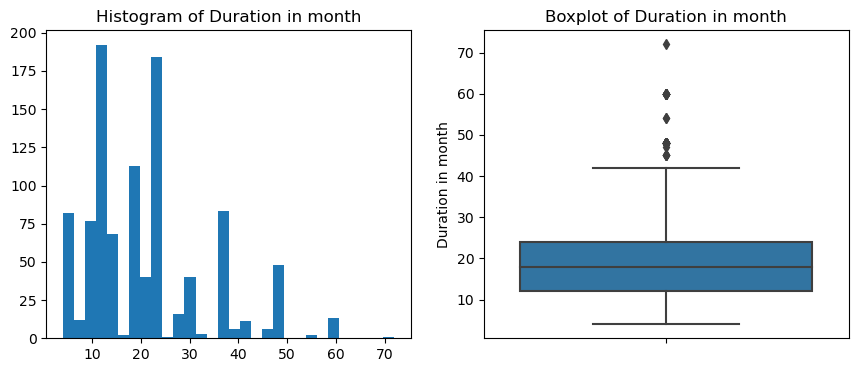

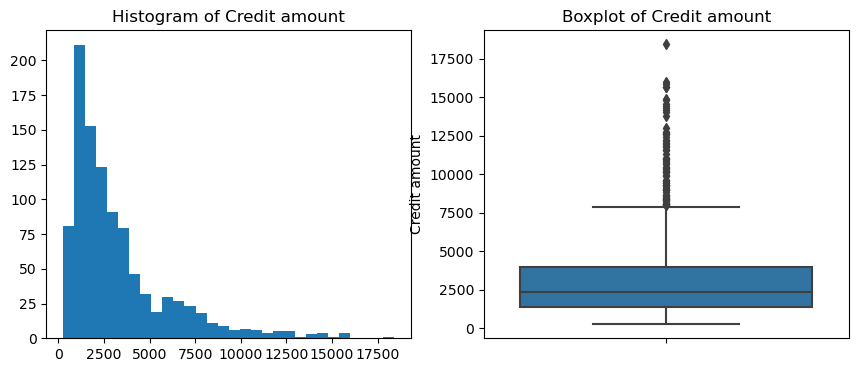

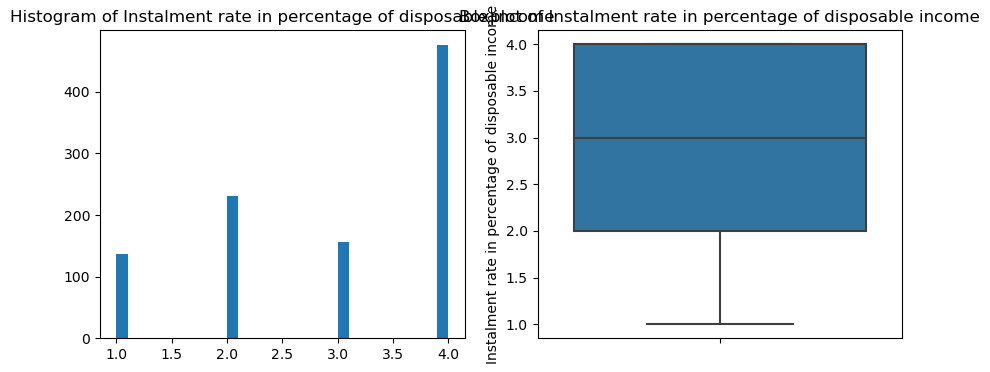

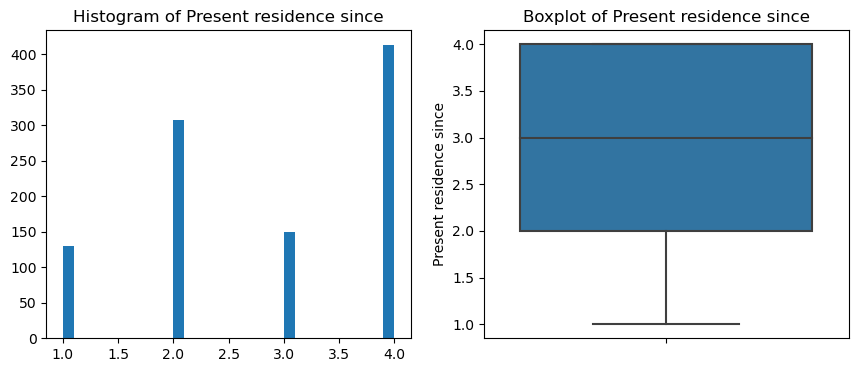

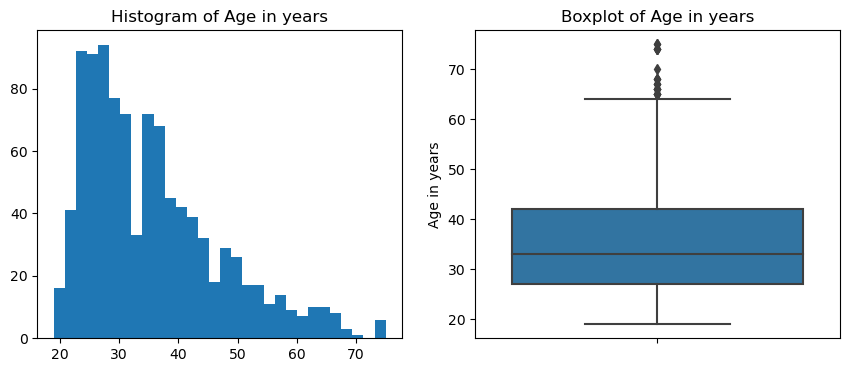

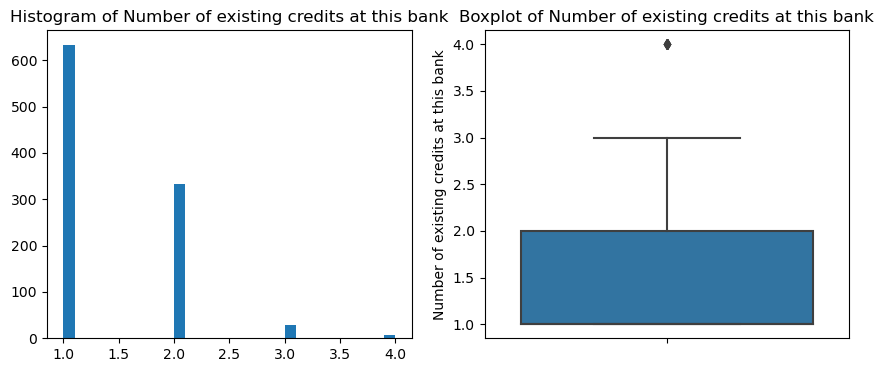

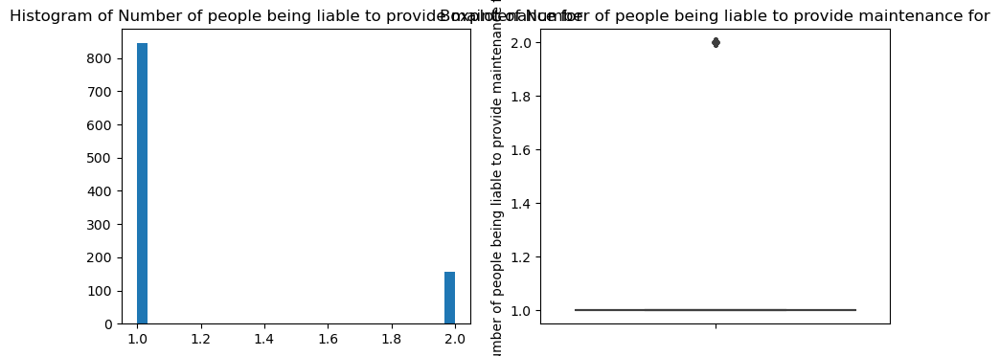

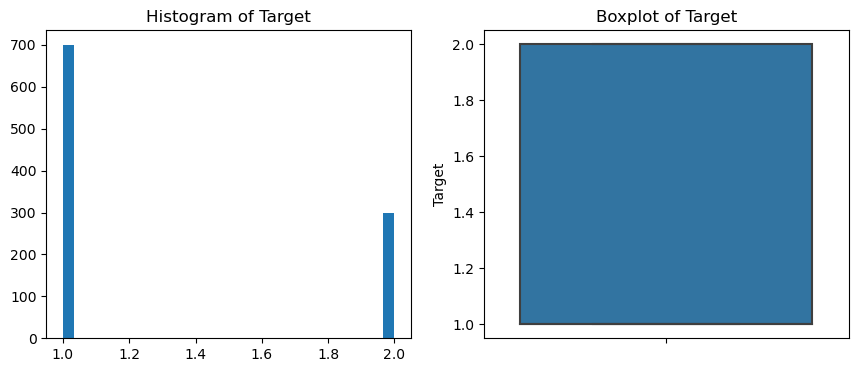

In [9]:
for col in num_cols:
    distribution_plots(df, col)

Duration in month: _Continuous_
- Represents either the duration of the account or loan

Credit amount: _Continuous_
- Represents the amont of credit or loan taken

Instalment rate in percentage of disposable income: _Discrete, Financial Strain_
- Indicates Financial strain relative to disposable income

Present residence since: _Discrete_
- Represents how long the customer has been residing at their current address

Age in years: _Continuous_
- Demographic information

Number of existing credits at this bank: _Discrete, Financial strain_
- How many credits or loans the customer has at the bank

Number of people being liable to provide maintenance for: _Discrete, Financial strain_
- Likely indicates number of dependents and thus financial strain

Target: _Discrete_
- Metadata says this represents good and bad, but it is unclear as to the definition of this column

#### 1.1.1.2 Categorical

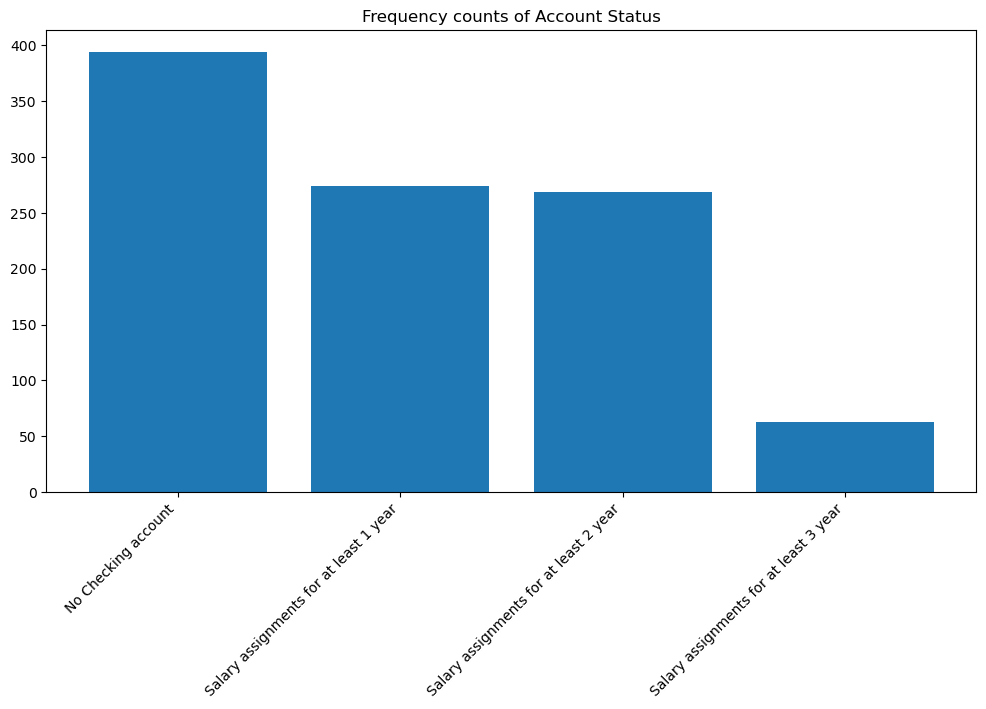

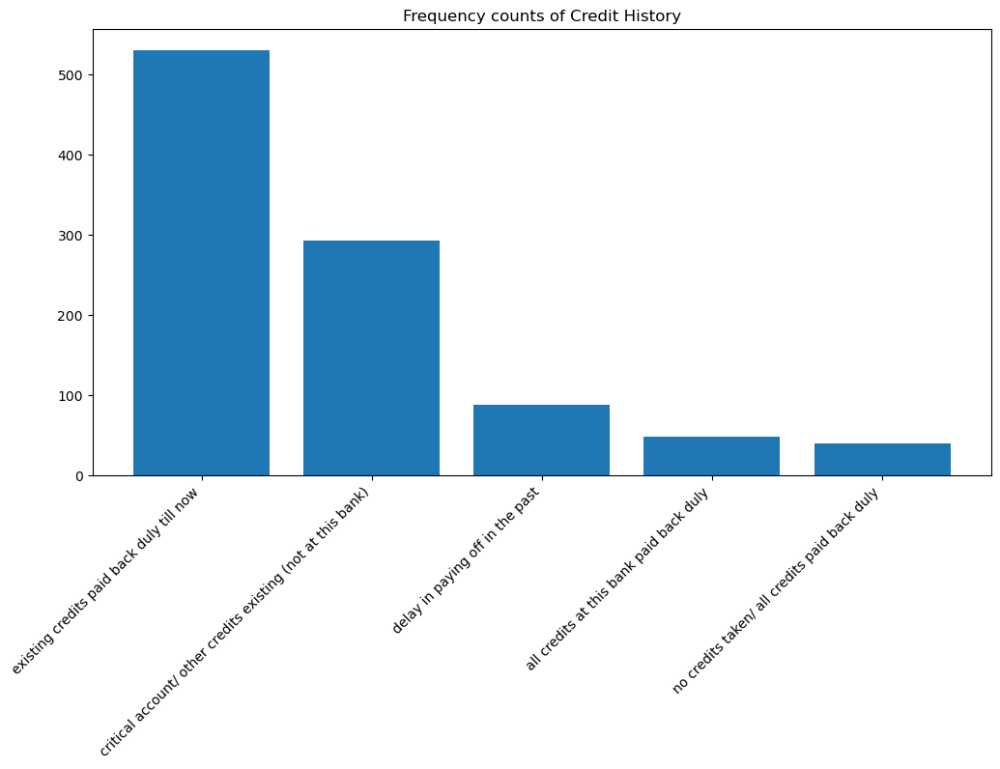

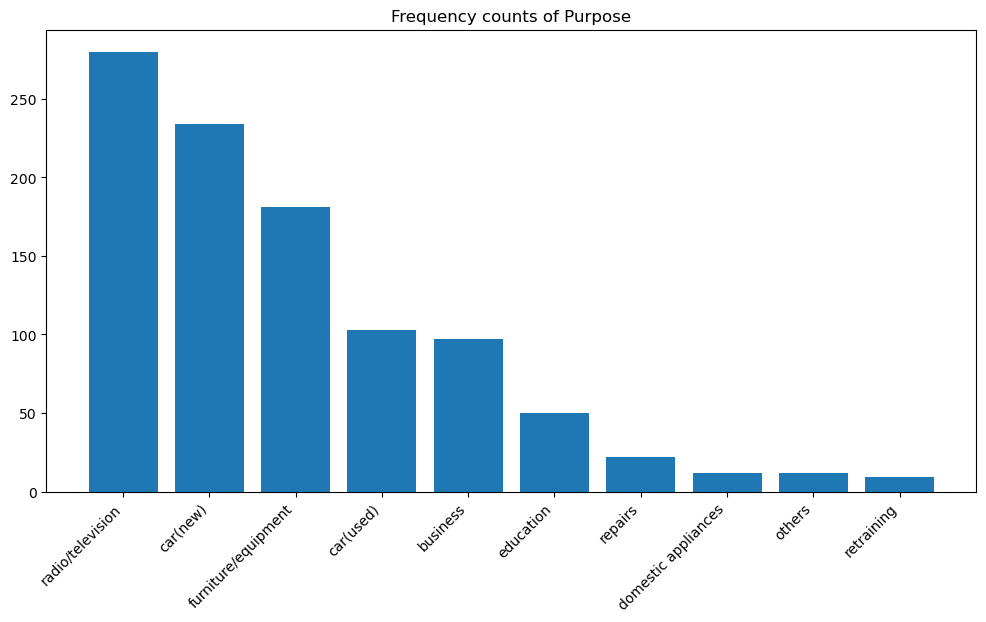

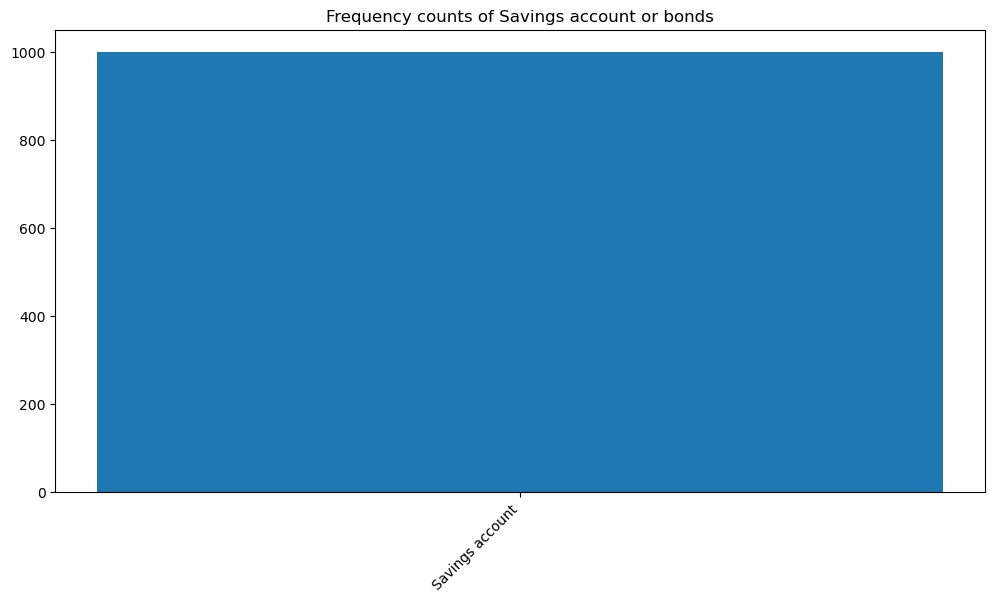

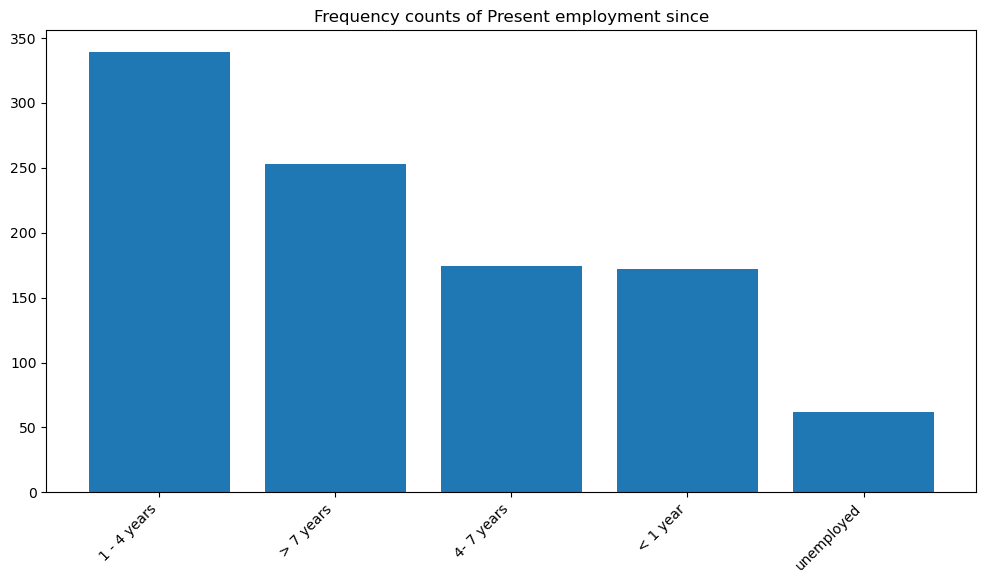

...

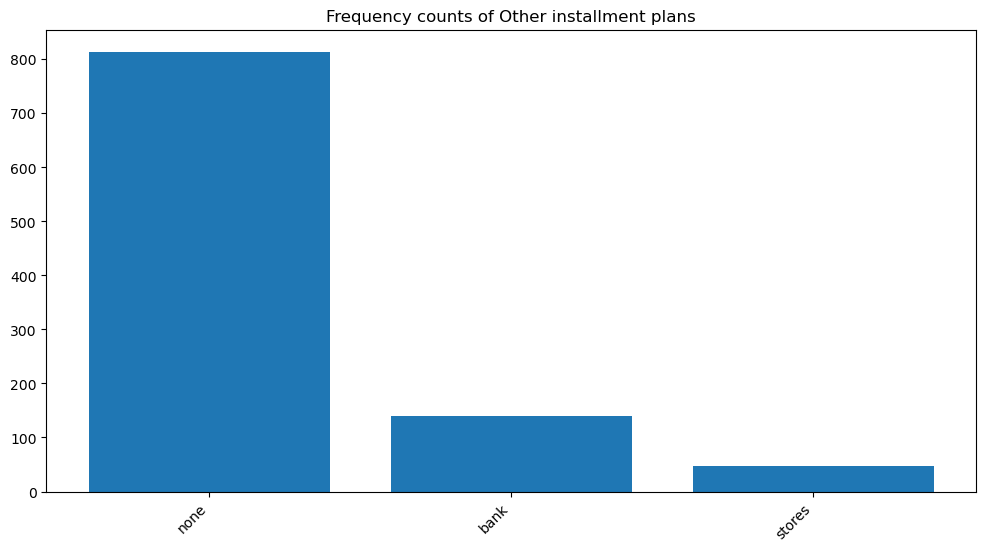

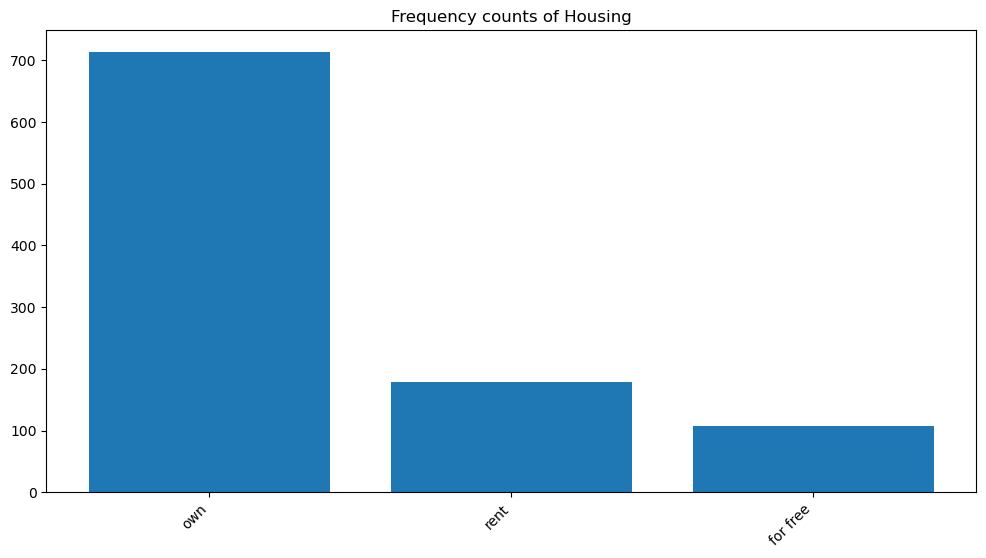

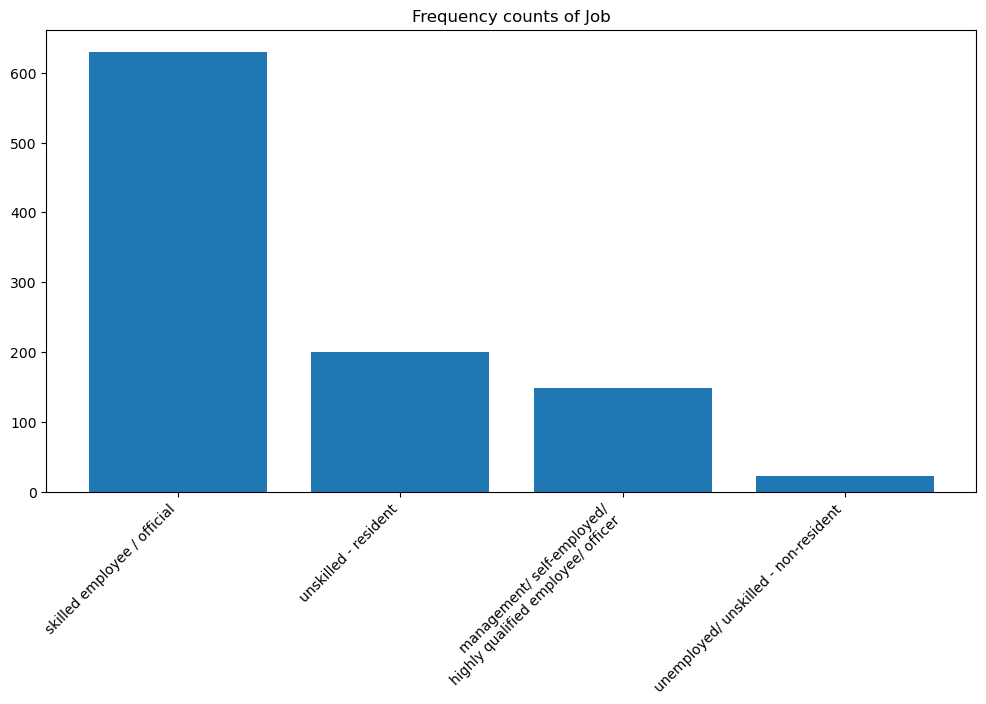

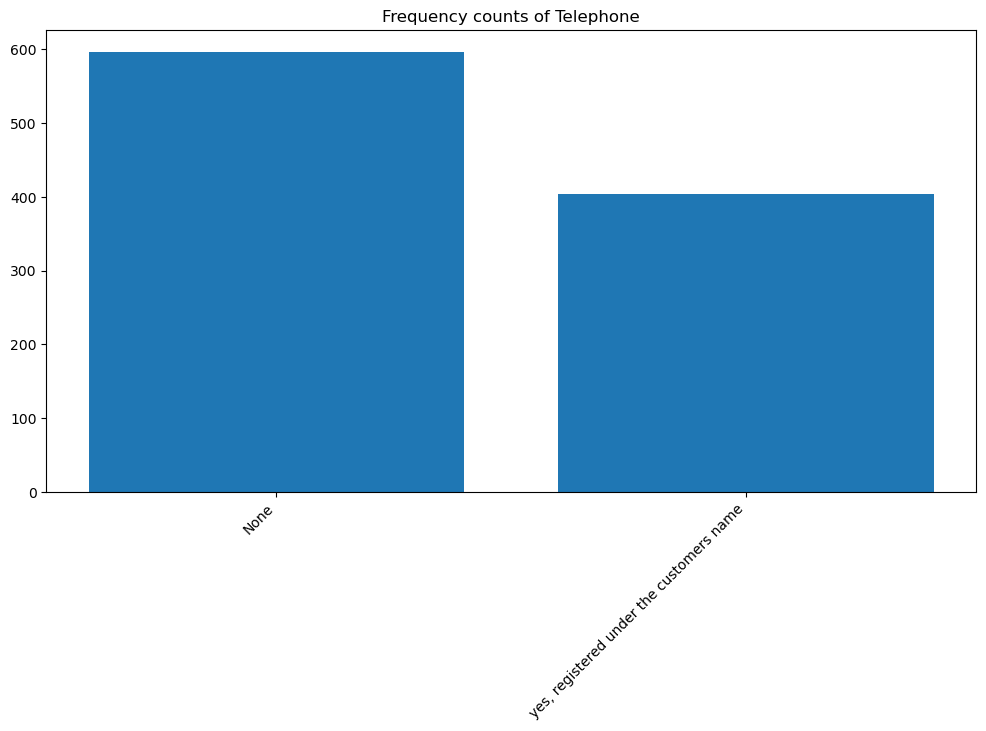

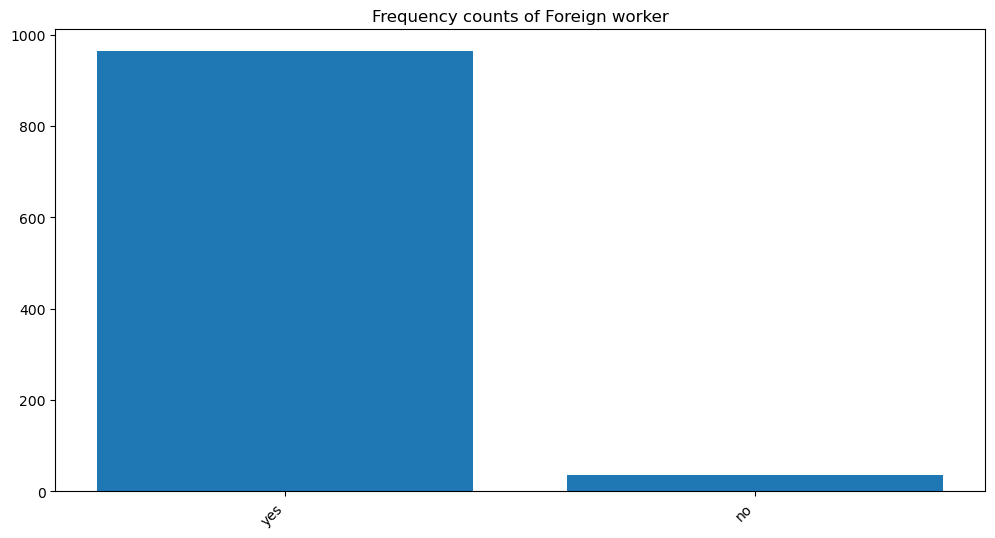

In [10]:
for col in cat_cols:
    counts = df[col].value_counts()
    
    plt.figure(figsize=(12,6))
    plt.title(f'Frequency counts of {col}')
    plt.bar(counts.index, counts.values)
    plt.xticks(rotation=45, ha='right')

Account Status: _Hierarchy in terms of duration_
- Likely indicates increasing levels of financial stability or commitment

Credit History: _Hierarchy in terms of creditworthiness_
- Most customers have been paying their existing credits back on time for all banks
- There are customers that have unpaid credits at other banks, but not the current one
- The categories under this column seem to indicate if the varying levels of financial debt that a loan applicant has

Purpose: _High cardinality_
- Most loans were made to purchase electronics like radios or television
- There are two different values for a the “car” purpose, one for old and new
- Some purposes can be grouped together as they fall under the same category

Savings account or bonds
- Only contains one class so the column should be dropped

Present employment since: _Hierarchy in terms of job stability which potentially impacts creditworthiness_
- Shows how long the loan applicant has held their current job for with majority of applicants having held onto their job for 1-4 years or longer than 7 years.

Personal status and sex: _Medium cardinality, Demographic information_
- It has 3 different classes to represent males and only 1 class to represent female, meaning there is severe under representation of the female gender.
- Since the personal statuses for the female gender are all mashed into 1 class, it is impossible to split this column by personal status accurately. It is possible to split based on gender though.
- I will create a new “Gender” column

Other debtors or guarantors: _Low cardinality_
- Majority of loan applicants do not have other debtors or guarantors to cover for their loan.

Property: _Medium cardinality_
- From most owned property to least owned, loan applicants have car or others, real estate, savings agreements / life insurance, or unknown / no property

Other instalment: plans _Low cardinality, Financial strain_
- Most loan applicants do not have other instalment plans.
- More applicants have other instalment plans with banks than stores.

Housing: _Hierarchy in terms of financial stability_
- Most applicants own their own house
- More applicants rent their house than live in one for free

Job: _Hierarchy in terms of skill -> income stability -> financial stability_
- Most are skilled employees
- Followed by unskilled residents
- Followed by management / self-employed/ highly qualified employee
- The class with least representation is unemployed / unskilled non-residents

Telephone: _Low Cardinality / Binary_
- Around 3/5 of customers do not have a telephone

Foreign worker: _Low Cardinality / Binary_
- Overwhelming majority of loan applicants are foreign workers

In [11]:
# Define the mapping from original categories to new groups
purpose_mapping = {
    'radio/television': 'Electronics',
    'domestic appliances': 'Electronics',
    'car(new)': 'Automobile',
    'car(used)': 'Automobile',
    'furniture/equipment': 'Home',
    'repairs': 'Home',
    'business': 'Business',
    'education': 'Education/Training',
    'retraining': 'Education/Training',
    'others': 'Other'
}
# Apply the mapping to the 'Purpose' column
df['Purpose_group'] = df['Purpose'].map(purpose_mapping)

In [12]:
df['Purpose_group'].value_counts()

Automobile            337
Electronics           292
Home                  203
Business               97
Education/Training     59
Other                  12
Name: Purpose_group, dtype: int64

In [13]:
# dropping 'Savings account or bonds'
df = df.drop(columns = ['Savings account or bonds'])

In [14]:
# Extract the gender information from the "personal status and sex" column
df['Gender'] = df['Personal status and sex'].str.split(':').str[0].str.strip()

In [15]:
df['Gender'].value_counts()

male      690
female    310
Name: Gender, dtype: int64

#### 1.1.2 Multivariate

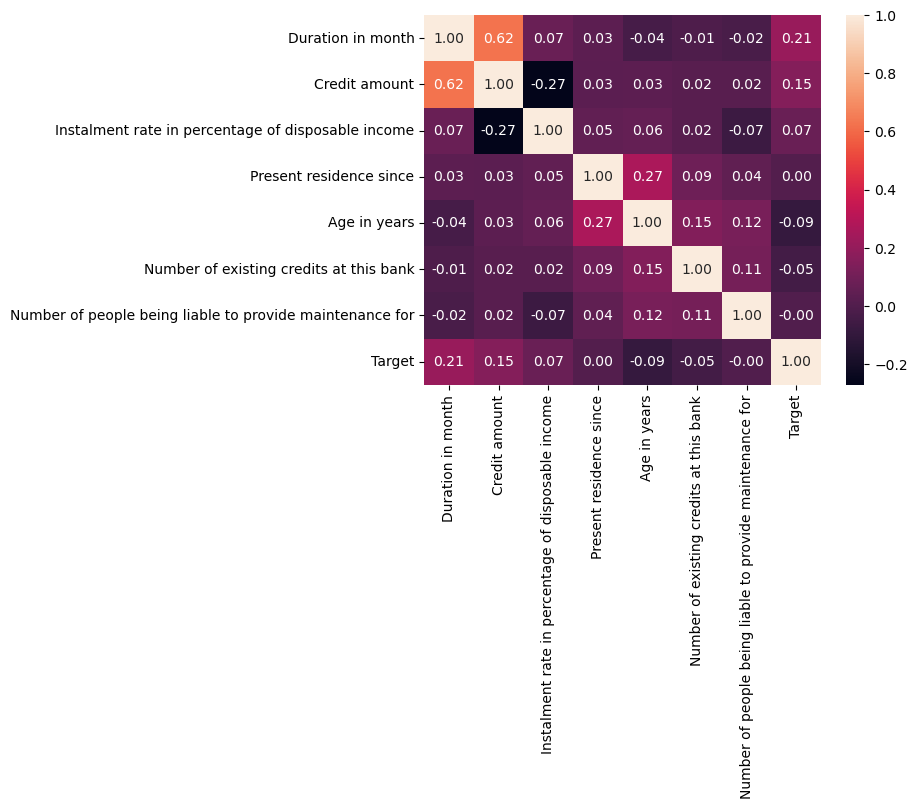

In [16]:
sns.heatmap(df.corr(), annot=True, fmt='.2f')
plt.show()

- Credit amount is highly positively correlated with Duration in month
- Credit amount is somewhat negatively correlated with Instalment rate in percentage of disposable income

_I have to keep in mind to try and not use these two features together when clustering as high correlation can distort distance metrics._

From data exploration, I have come to the conclusion that the various columns in the data come together to represent the applicant's financial health and ability to manage debt. A theme that some columns seem to share is the representation of financial stability and Financial strain. I will use these features to fit into the KMeans model later on.

### 1.1.3 Missing values

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Account Status                                            1000 non-null   object
 1   Duration in month                                         1000 non-null   int64 
 2   Credit History                                            1000 non-null   object
 3   Purpose                                                   1000 non-null   object
 4   Credit amount                                             1000 non-null   int64 
 5   Present employment since                                  1000 non-null   object
 6   Instalment rate in percentage of disposable income        1000 non-null   int64 
 7   Personal status and sex                                   1000 non-null   object
 8   Other debtors or guarantors  

In [18]:
for col in df.columns:
    print(df[col].value_counts())
    print("\n\n")

No Checking account                       394
Salary assignments for at least 1 year    274
Salary assignments for at least 2 year    269
Salary assignments for at least 3 year     63
Name: Account Status, dtype: int64



24    184
12    179
18    113
36     83
6      75
15     64
9      49
48     48
30     40
21     30
10     28
60     13
27     13
42     11
11      9
20      8
8       7
4       6
45      5
7       5
39      5
14      4
13      4
33      3
28      3
54      2
16      2
22      2
47      1
5       1
26      1
72      1
40      1
Name: Duration in month, dtype: int64



existing credits paid back duly till now                       530
critical account/ other credits existing (not at this bank)    293
delay in paying off in the past                                 88
all credits at this bank paid back duly                         49
no credits taken/ all credits paid back duly                    40
Name: Credit History, dtype: int64



radio/television       280
car(new

_Other than `Property`column which groups its unknown values together with another value, most columns don't contain a value representing nulls._

### 1.1.4 Outliers

#### Numerical transformation

In [19]:
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.transformation import BoxCoxTransformer
from feature_engine.transformation import LogTransformer
from feature_engine.transformation import ReciprocalTransformer
from feature_engine.transformation import PowerTransformer
import scipy.stats as stats

Columns seem alright.

In [20]:
num_cols = df.select_dtypes(include='number').columns

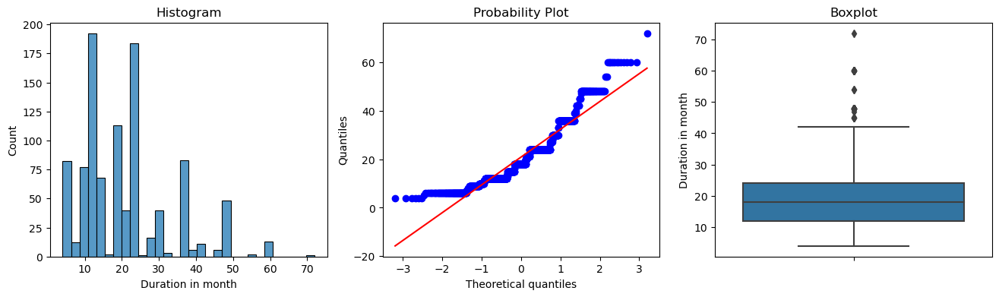

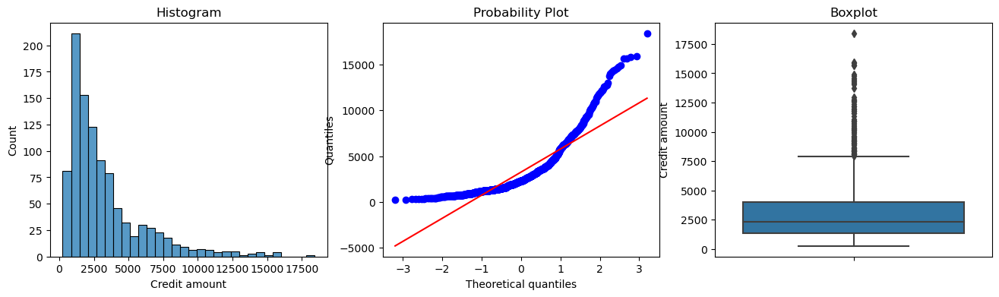

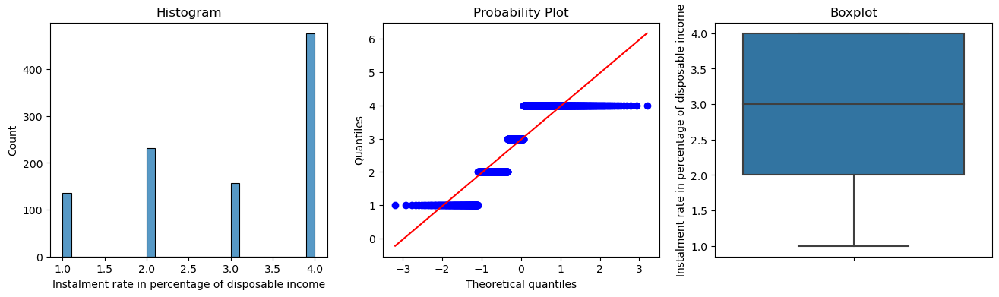

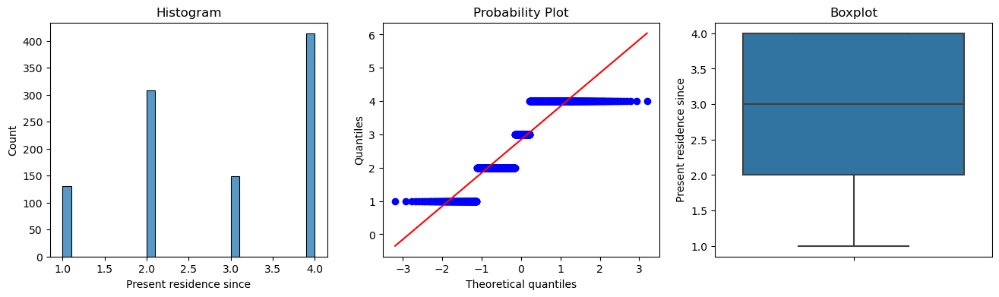

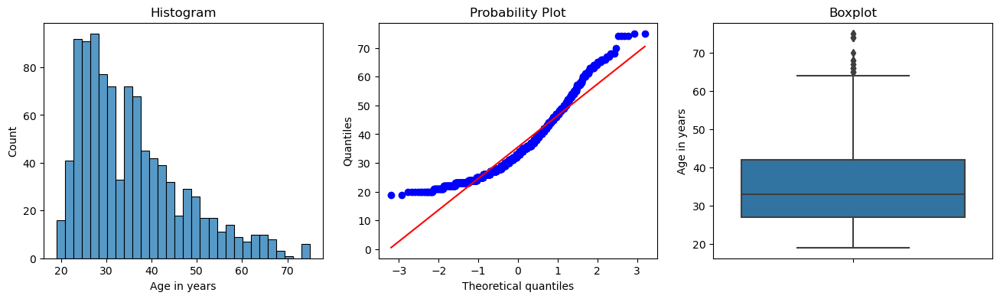

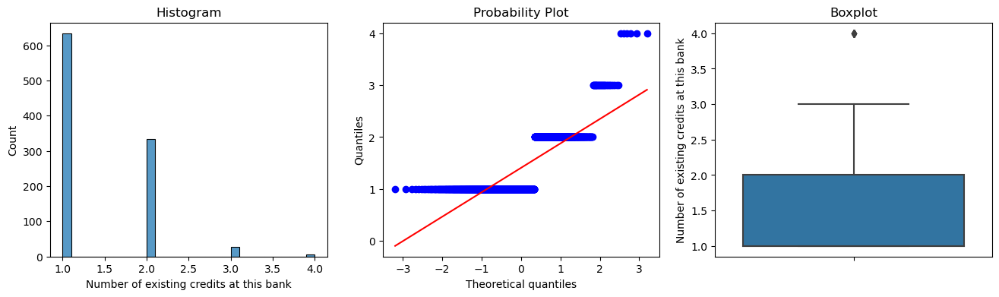

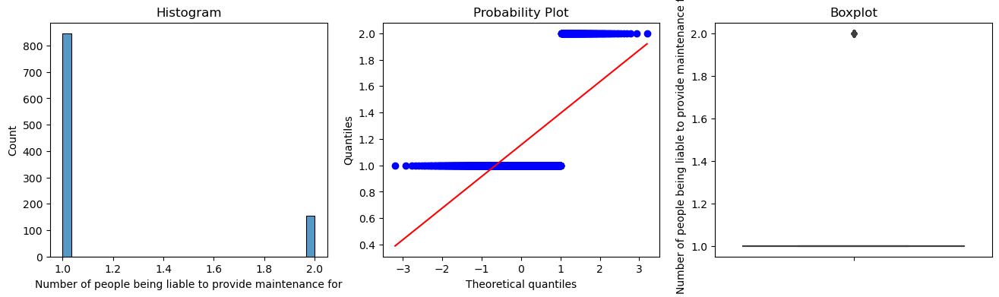

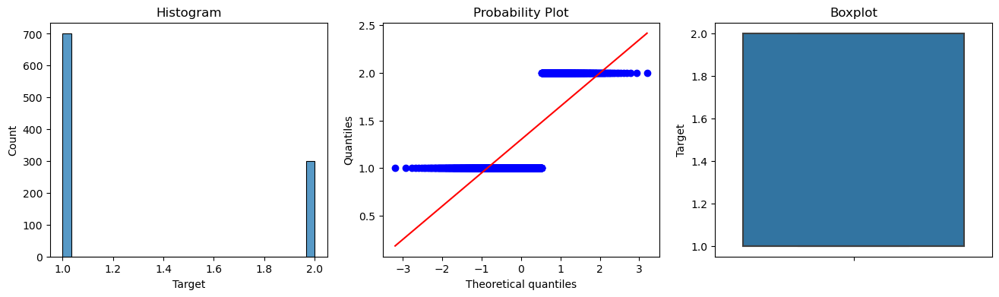

In [21]:
# Check variable distribution and outliers
# Diagnostic plots
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()


for n in num_cols:
    diagnostic_plots(df, n)

_From the above we can tell that `Duration in month`, `Credit amount`, and `Age in years` are continuous columns, and they all have outliers._

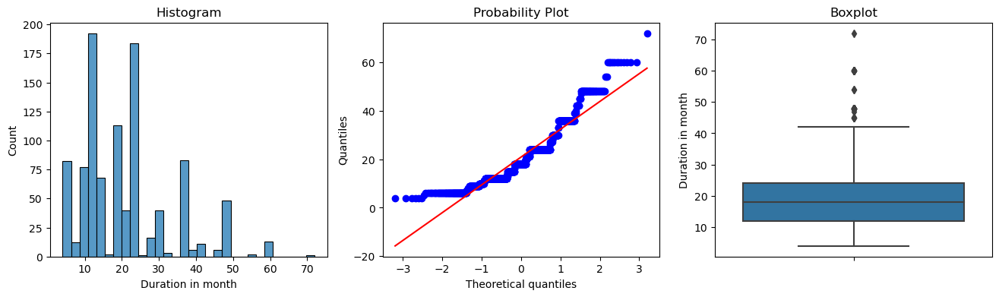

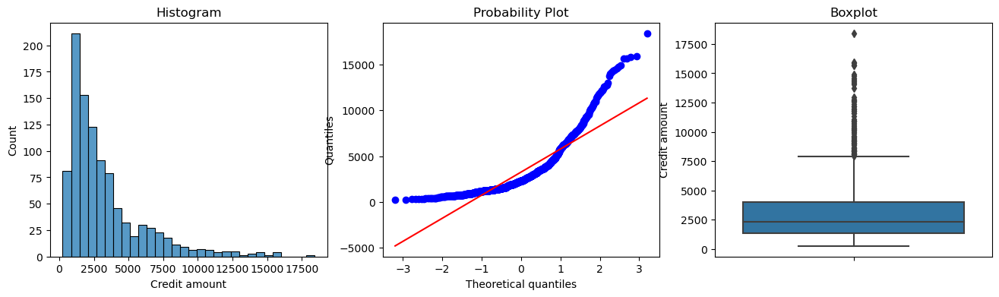

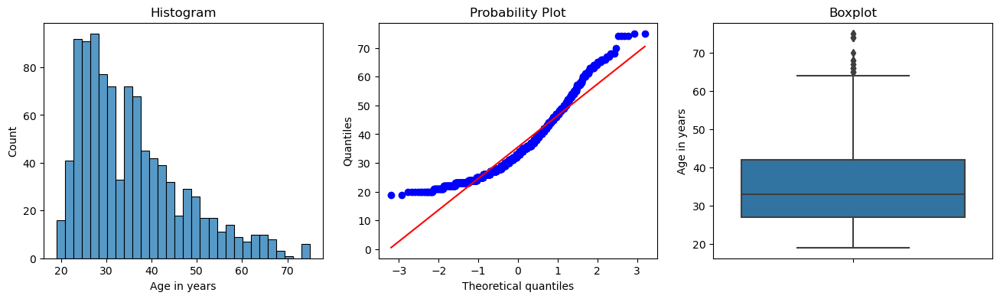

In [22]:
transform_cols = ['Duration in month', 'Credit amount', 'Age in years']
for col in transform_cols:
    diagnostic_plots(df, col)

YeoJohnsonTransformer(variables=['Duration in month', 'Credit amount',
                                 'Age in years'])


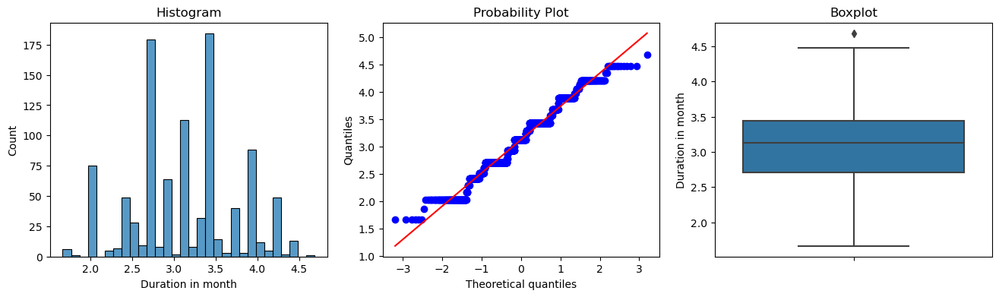

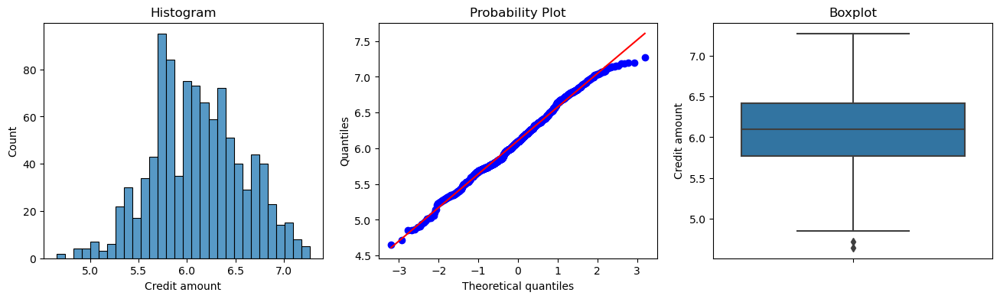

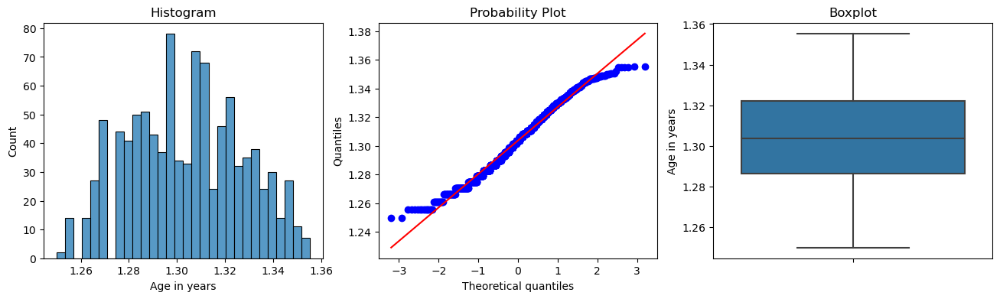




BoxCoxTransformer(variables=['Duration in month', 'Credit amount',
                             'Age in years'])


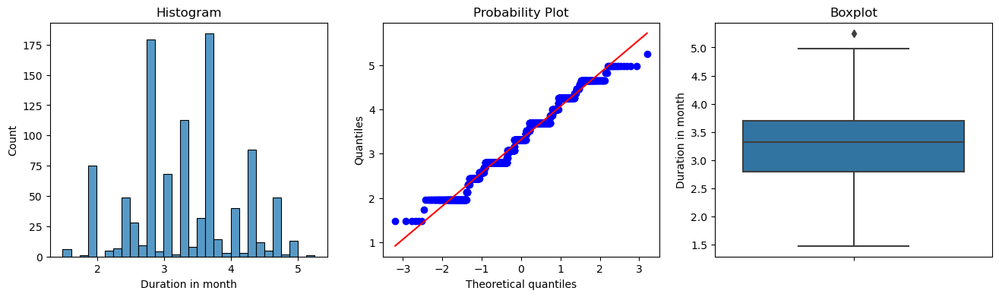

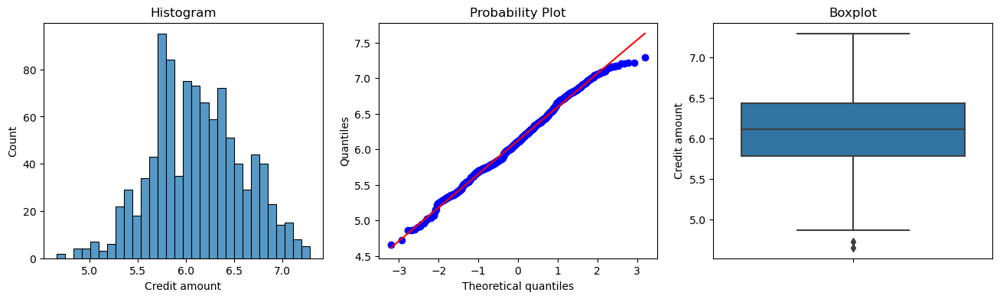

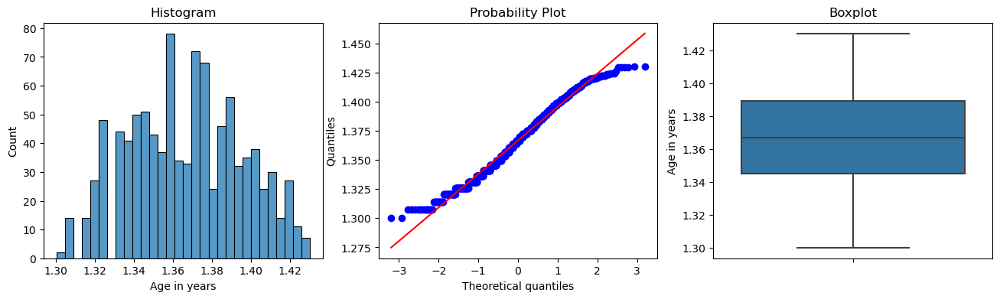




LogTransformer(variables=['Duration in month', 'Credit amount', 'Age in years'])


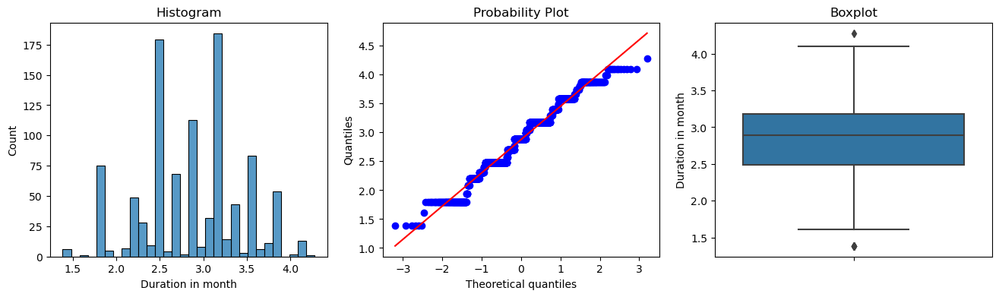

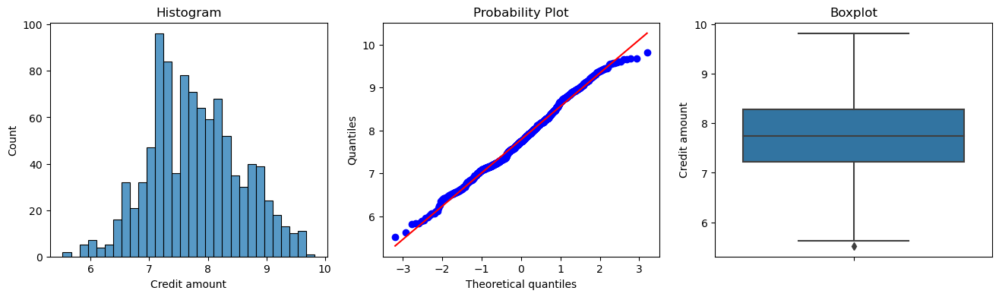

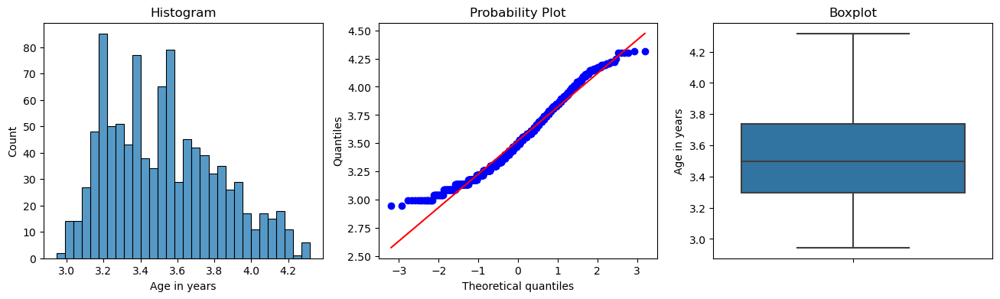




ReciprocalTransformer(variables=['Duration in month', 'Credit amount',
                                 'Age in years'])


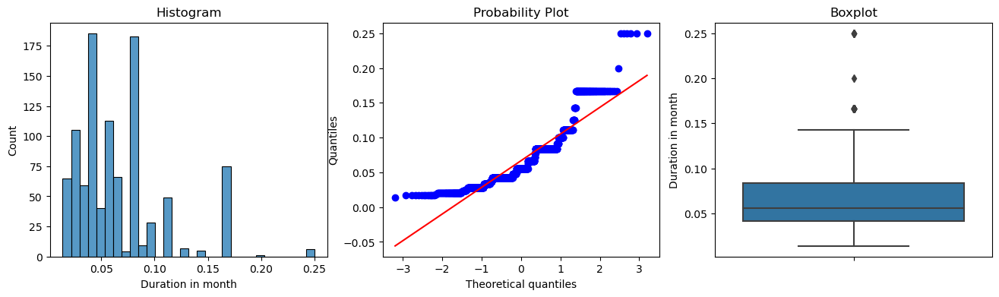

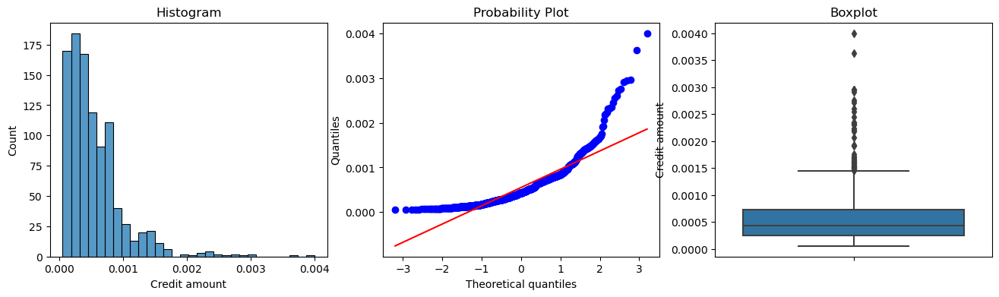

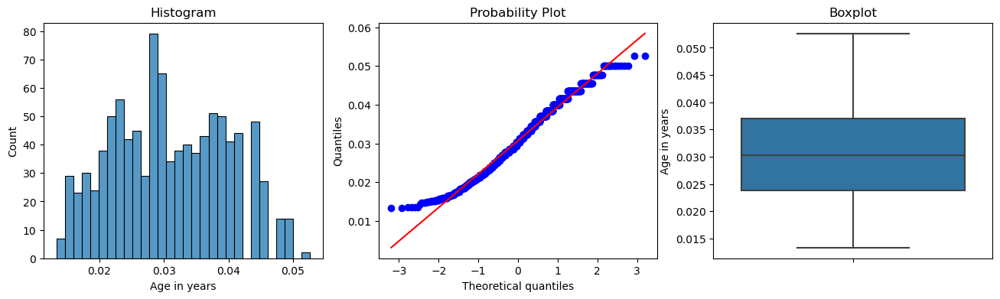




PowerTransformer(variables=['Duration in month', 'Credit amount',
                            'Age in years'])


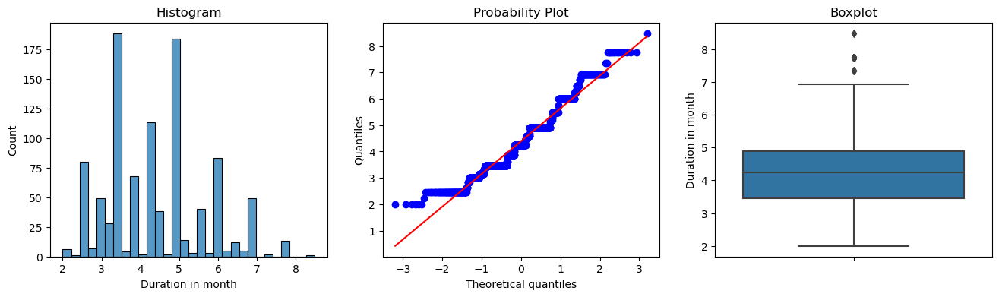

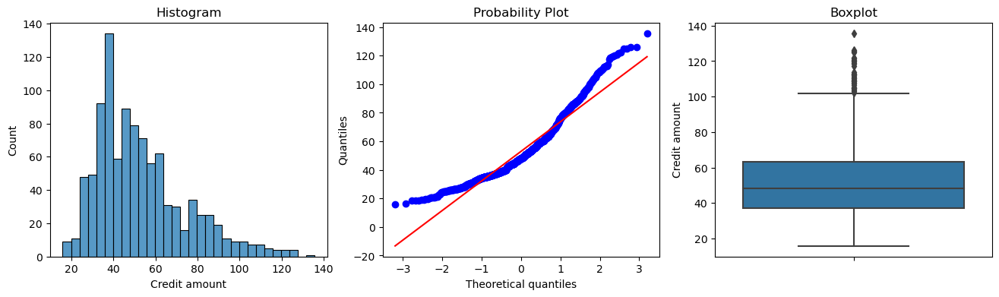

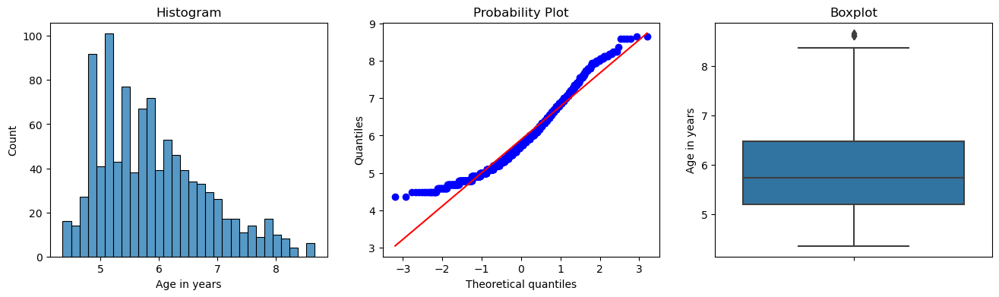

In [23]:
yjt = YeoJohnsonTransformer(variables=transform_cols)
bct = BoxCoxTransformer(variables=transform_cols)
lt = LogTransformer(variables=transform_cols)
rt = ReciprocalTransformer(variables=transform_cols)
pt = PowerTransformer(variables=transform_cols, exp=0.5)

transformerList = [yjt, bct, lt, rt, pt]

for transformer in transformerList:
    test = df.copy()
    print(f'{transformer}')
    transformer.fit(df)
    test = transformer.transform(test)
    for col in transform_cols:
        diagnostic_plots(test, col)
    print('\n\n')

_I decided to use YeoJohnson for `Duration in month`, LogTransformer for `Credit amount`, and Reciprocal for `Age in years` as they handled the most outliers_

_Since I'm not sure how big the effect of outliers are on clustering, I will make the numerical transformations occupy separate columns of my dataframe._

In [24]:
yjt = YeoJohnsonTransformer(variables=['Duration in month'])
lt = LogTransformer(variables = ['Credit amount'])
rt = ReciprocalTransformer(variables = ['Age in years'])

df_t = df.copy()

transformList=[yjt, lt, rt]
for transformer in transformList:
    transformer.fit(df_t)
    df_t = transformer.transform(df_t)
    
df['T_Duration in month'] = df_t['Duration in month']
df['T_Credit amount'] = df_t['Credit amount']
df['T_Age in years'] = df_t['Age in years']

### 1.1.5 Categorical Encoding
Since there are new derived columns since my data exploration section, here is a refresher on the cardinality of said columns.

In [25]:
cat_cols = []

for col in df.columns:
    if df[col].dtypes == 'object':
        cat_cols.append(col)
        print(f'{col} has {df[col].nunique()} categories')

Account Status has 4 categories
Credit History has 5 categories
Purpose has 10 categories
Present employment since has 5 categories
Personal status and sex has 4 categories
Other debtors or guarantors has 3 categories
Property has 4 categories
Other installment plans has 3 categories
Housing has 3 categories
Job has 4 categories
Telephone has 2 categories
Foreign worker has 2 categories
Purpose_group has 6 categories
Gender has 2 categories


_In addition to cardinality, the following columns have their own independent hierarchies._
- _Account Status_
- _Credit History_
- _Present employment since_
- _Housing_
- _Job_

_I will perform encoding for features that represent Financial Stability or Financial strain - aspects of a loan applicant that banks take into consideration when processing loans._

#### 1.1.5.1 Encoding for Financial Stability

In [26]:
df_encoded = df.copy()

##### Account Status
Hierarchy here is in terms of duration of salary assignment presence. Categories under this feature can also indicate increasing levels of financial stability or commitment.

In [27]:
df['Account Status'].unique()

array(['Salary assignments for at least 1 year',
       'Salary assignments for at least 2 year', 'No Checking account',
       'Salary assignments for at least 3 year'], dtype=object)

In [28]:
# map to replace values
status_mapping = {
    'No Checking account' : 0,
    'Salary assignments for at least 1 year' : 1,
    'Salary assignments for at least 2 year' : 2,
    'Salary assignments for at least 3 year' : 3
}

df_encoded['Account Status'] = df['Account Status'].map(status_mapping)

In [29]:
df_encoded['Account Status'].unique()

array([1, 2, 0, 3], dtype=int64)

##### Credit History
The hierarchy here is in terms of creditworthiness. The categories under this feature indicate varying levels of creditworthiness, and can be ranked and encoded accordingly.

In [30]:
df_encoded['Credit History'].unique()

array(['critical account/ other credits existing (not at this bank)',
       'existing credits paid back duly till now',
       'delay in paying off in the past',
       'no credits taken/ all credits paid back duly',
       'all credits at this bank paid back duly'], dtype=object)

In [31]:
# making map to replace values
credhist_mapping = {
    'all credits at this bank paid back duly' : 4,
    'no credits taken/ all credits paid back duly' : 3, # highest creditworthiness
    'existing credits paid back duly till now' : 2,
    'delay in paying off in the past': 1,  
    'critical account/ other credits existing (not at this bank)' : 0 # lowest
}

df_encoded['Credit History'] = df['Credit History'].map(credhist_mapping)

In [32]:
df_encoded['Credit History'].unique()

array([0, 2, 1, 3, 4], dtype=int64)

##### Present employment since
It has a hierarchy in terms of job stability.

In [33]:
df['Present employment since'].unique()

array(['> 7 years', '1 - 4 years', '4- 7 years', 'unemployed',
       ' < 1 year'], dtype=object)

In [34]:
employment_mapping = {
    '> 7 years' : 4, 
    '4- 7 years' : 3, 
    '1 - 4 years' : 2, 
    ' < 1 year' : 1, 
    'unemployed': 0 
}

df_encoded['Present employment since'] = df['Present employment since'].map(employment_mapping)

In [35]:
df_encoded['Present employment since'].unique()

array([4, 2, 3, 0, 1], dtype=int64)

##### Housing
This column has a hierarchy in terms of indication of applicant's financial situation, with 'own' possibly suggesting higher stability.

In [36]:
df['Housing'].unique()

array(['own', 'for free', 'rent'], dtype=object)

In [37]:
housing_mapping = {
    'for free' : 0,
    'rent' : 1,
    'own' : 2
}

df_encoded['Housing'] = df['Housing'].map(housing_mapping)

In [38]:
df_encoded['Housing'].unique()

array([2, 0, 1], dtype=int64)

##### Job
This column has a hierarchy in terms of skill level.

In [39]:
df['Job'].unique()

array(['skilled employee / official', 'unskilled - resident',
       'management/ self-employed/\nhighly qualified employee/ officer',
       'unemployed/ unskilled - non-resident'], dtype=object)

In [40]:
job_mapping = {
    'unemployed/ unskilled - non-resident' : 0, 
    'unskilled - resident' : 1, 
    'skilled employee / official' : 2, 
    'management/ self-employed/\nhighly qualified employee/ officer' : 3
}

df_encoded['Job'] = df['Job'].map(job_mapping)

In [41]:
df_encoded['Job'].unique()

array([2, 1, 3, 0], dtype=int64)

In [42]:
df_encoded.head()

,Account Status,Duration in month,Credit History,Purpose,Credit amount,Present employment since,Instalment rate in percentage of disposable income,Personal status and sex,Other debtors or guarantors,Present residence since,...,Job,Number of people being liable to provide maintenance for,Telephone,Foreign worker,Target,Purpose_group,Gender,T_Duration in month,T_Credit amount,T_Age in years
0,1,6,0,radio/television,1169,4,4,male : single,none,4,...,2,1,"yes, registered under the customers name",yes,1,Electronics,male,2.024562,7.063904,0.014925
1,2,48,2,radio/television,5951,2,2,female : divorced/separated/married,none,2,...,2,1,None,yes,2,Electronics,female,4.214961,8.691315,0.045455
2,0,12,0,education,2096,3,2,male : single,none,3,...,1,2,None,yes,1,Education/Training,male,2.702766,7.647786,0.020408
3,1,42,2,furniture/equipment,7882,3,2,male : single,guarantor,4,...,2,2,None,yes,1,Home,male,4.062468,8.972337,0.022222
4,1,24,1,car(new),4870,2,3,male : single,none,4,...,2,2,None,yes,2,Automobile,male,3.437882,8.490849,0.018868


#### 1.1.5.2 Encoding for Financial strain
##### Other instalment plans
_Other installment plans has 3 categories. Due to its low cardinality I would have opted for one hot encoding if not for KMeans' sensitivity to binary values due to the way it calculates similarity. Thus, I will force a hierarchy as reasonably as I can._ 

In [43]:
df['Other installment plans'].value_counts()

none      814
bank      139
stores     47
Name: Other installment plans, dtype: int64

In [44]:
installment_mapping = {
    'none' : 0, # having no existing instalment plans to pay for means the customer has no debt burden and thus no Financial strain
    'stores' : 1, # installment plans for stores typically involve consumer products that come at consumer prices
    'bank' : 2 # instalment plans for banks are most likely loans to pay back for, which woulld involve more money than consumer products
}

df_encoded['Other installment plans'] = df['Other installment plans'].map(installment_mapping)

In [45]:
df_encoded['Other installment plans'].value_counts()

0    814
2    139
1     47
Name: Other installment plans, dtype: int64

#### 1.1.5.3 Subsetting data

In [46]:
df_scaled= df_encoded.select_dtypes(include='number')

### 1.1.6 Scaling
This is essential to make sure all 

In [47]:
from sklearn.preprocessing import StandardScaler

In [48]:
scaler = StandardScaler()
scaler.fit(df_scaled[df_scaled.columns])

df_scaled[df_scaled.columns] = scaler.transform(df_scaled[df_scaled.columns])

In [49]:
df_scaled.head()

,Account Status,Duration in month,Credit History,Credit amount,Present employment since,Instalment rate in percentage of disposable income,Present residence since,Age in years,Other installment plans,Housing,Number of existing credits at this bank,Job,Number of people being liable to provide maintenance for,Target,T_Duration in month,T_Credit amount,T_Age in years
0,-0.001045,-1.236478,-1.331622,-0.745131,1.338078,0.918477,1.046987,2.766456,-0.460831,0.585603,1.027079,0.146949,-0.428290,-0.654654,-1.797419,-0.933901,-1.820819
1,1.044372,2.248194,0.487534,0.949817,-0.317959,-0.870183,-0.765977,-1.191404,-0.460831,0.585603,-0.704926,0.146949,-0.428290,1.527525,1.764587,1.163046,1.689067
2,-1.046463,-0.738668,-1.331622,-0.416562,0.510060,-0.870183,0.140505,1.183312,-0.460831,0.585603,-0.704926,-1.383771,2.334869,-0.654654,-0.694530,-0.181559,-1.190472
3,-0.001045,1.750384,0.487534,1.634247,0.510060,-0.870183,1.046987,0.831502,-0.460831,-2.379476,-0.704926,0.146949,2.334869,-0.654654,1.516606,1.525148,-0.981913
4,-0.001045,0.256953,-0.422044,0.566664,-0.317959,0.024147,1.046987,1.535122,-0.460831,-2.379476,1.027079,0.146949,2.334869,1.527525,0.500910,0.904743,-1.367551


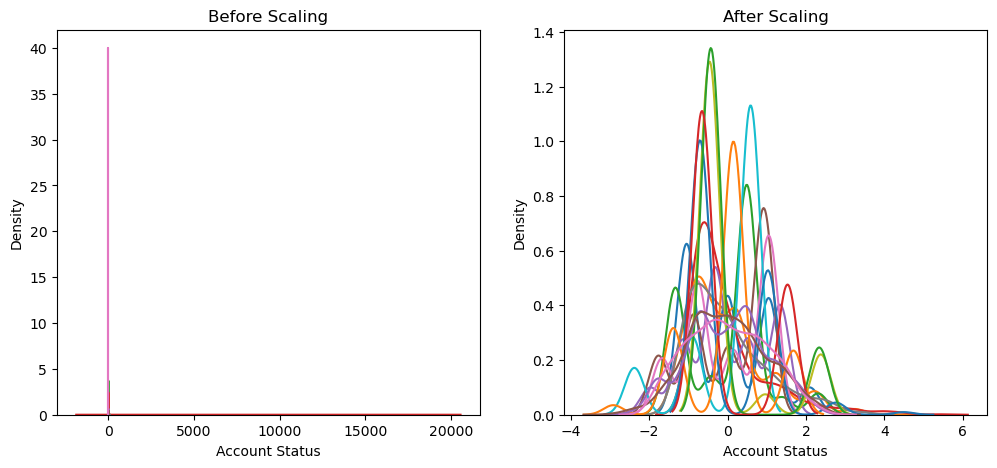

In [50]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))


ax1.set_title('Before Scaling')
for x in df_scaled[df_scaled.columns]:
    sns.kdeplot(df_encoded[x], ax = ax1, label = x)


ax2.set_title('After Scaling')
for x in df_scaled[df_scaled.columns]:
    sns.kdeplot(df_scaled[x], ax = ax2, label = x)
plt.show()

## 1.2 K-Means Clustering
_K-Means models will aim to strike a good balance between cluster inertia score and amount of clusters. Clusters will be evaluated using Sum of Squared Errors(SSE), AKA inertia, as well as silhouette score which is an evaluation of both cohesion and separation of the clusters._

_However before I start I want to test if curbing the effect of outliers provides me with better cluster metrics._

In [51]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score 
import plotly.graph_objects as go
import itertools
from sklearn.manifold import TSNE
import plotly.express as px

In [52]:
def find_optimal_clusters(data, cluster_range=(2, 11)):
    sse = []
    silh = []

    for i in range(cluster_range[0], cluster_range[1]):
        kmeans = KMeans(n_clusters=i, n_init=20, random_state=1)
        kmeans.fit(data)
        y_pred = kmeans.predict(data)
        sse.append(kmeans.inertia_)
        silh.append(silhouette_score(data, y_pred))

    fig, ax1 = plt.subplots()

    ax1.set_xlabel('Number of clusters (K)')
    ax1.set_ylabel('SSE', color='b')
    ax1.plot(range(cluster_range[0], cluster_range[1]), sse, color='b')
    ax1.tick_params(axis='y', labelcolor='b')

    ax2 = ax1.twinx()
    ax2.set_ylabel('Silhouette Score', color='r')
    ax2.plot(range(cluster_range[0], cluster_range[1]), silh, 'r')
    ax2.tick_params(axis='y', labelcolor='r')

    plt.title('SSE Elbow Method & Silhouette Score')
    plt.show()

#### Functions

In [53]:
def evaluate_kmeans(data, kmeans):
    # initialize kmean, fit and predict on data
    kmeans.fit(data)
    y_pred = kmeans.predict(data)
    
    # store and retrive metrics and cluster centers
    sse = kmeans.inertia_
    sil_score = silhouette_score(data, y_pred)
    cluster_centers = kmeans.cluster_centers_
    return sse, sil_score, cluster_centers, y_pred

In [54]:
def plot_clusters2d(data, x, y, cluster_centers, y_pred, title):

    plt.scatter(data[x], data[y], c=y_pred, s=50, alpha=0.5)
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', s=200, marker='X')
    plt.title(title)
    plt.show()

In [55]:
# 3D Interactive Scatter Plot
def plot_3d_scatter(df, kmeans, x, y, z):
    # Create the scatter plot
    fig = go.Figure()
    kmeans.fit(df)
    y_pred = kmeans.predict(df)
    
    # Add scatter points
    fig.add_trace(go.Scatter3d(
        x=df[x],
        y=df[y],
        z=df[z],
        mode='markers',
        marker=dict(
            size=5,
            color=y_pred,  # Color by y_pred
            colorscale='Viridis',  # Choose a colorscale
            opacity=0.8
        ),
        name='Data Points'
    ))

    # Add cluster centers
    fig.add_trace(go.Scatter3d(
        x=kmeans.cluster_centers_[:, df.columns.get_loc(x)],
        y=kmeans.cluster_centers_[:, df.columns.get_loc(y)],
        z=kmeans.cluster_centers_[:, df.columns.get_loc(z)],
        mode='markers',
        marker=dict(
            size=10,
            color='red',
            symbol='x'
        ),
        name='Cluster Centers'
    ))

    # Update layout
    fig.update_layout(
        title='Interactive 3D Scatter Plot',
        scene=dict(
            xaxis_title=x,
            yaxis_title=y,
            zaxis_title=z
        )
    )

    # Show plot
    fig.show()

In [56]:
def plot_all_3d_scatter(df, kmeans_model):
    """
    Plot 3D scatter plots for all possible axes combinations of a DataFrame.

    Parameters:
    - df: DataFrame containing the data.
    - kmeans_model: Fitted KMeans model.
    """
    # Get column names from the DataFrame
    columns = df.columns

    # Generate all possible combinations of 3 columns
    combinations = list(itertools.combinations(columns, 3))

    # Iterate over each combination and plot 3D scatter plot
    for combination in combinations:
        x_col, y_col, z_col = combination
        print(f"Plotting 3D scatter plot for columns: {x_col}, {y_col}, {z_col}")

        # Call the plot_3d_scatter function
        plot_3d_scatter(df, kmeans_model, x_col, y_col, z_col)

In [57]:
def tsne_kmeans(df, kmeans, tsne_components=3, random_state=1):
    """
    Perform KMeans clustering, apply t-SNE for dimensionality reduction,
    and create a 3D scatter plot of the results.
    
    Parameters:
    - df: DataFrame, the input data for clustering
    - n_clusters: int, the number of clusters for KMeans clustering
    - tsne_components: int, the number of dimensions for t-SNE (2 or 3)
    - random_state: int, random seed for reproducibility
    
    Returns:
    - fig: plotly.graph_objs._figure.Figure, the 3D scatter plot figure
    """
    # Perform KMeans Clustering
    labels = kmeans.fit_predict(df)
    
    # Apply t-SNE for dimensionality reduction
    tsne = TSNE(n_components=tsne_components, random_state=1)
    tsne_results = tsne.fit_transform(df)
    
    # Create a DataFrame for the t-SNE results
    tsne_columns = [f'TSNE{i+1}' for i in range(tsne_components)]
    df_tsne = pd.DataFrame(tsne_results, columns=tsne_columns)
    df_tsne['Cluster'] = labels
    
    # Create a 3D scatter plot
    if tsne_components == 3:
        fig = px.scatter_3d(df_tsne, x='TSNE1', y='TSNE2', z='TSNE3', color='Cluster', symbol='Cluster')
        fig.update_traces(marker=dict(colorbar=None))
        fig.update_layout(title='3D Scatter Plot of t-SNE with KMeans Clustering')
    elif tsne_components == 2:
        fig = px.scatter(df_tsne, x='TSNE1', y='TSNE2', color='Cluster', symbol='Cluster')
        fig.update_traces(marker=dict(colorbar=None))
        fig.update_layout(title='2D Scatter Plot of t-SNE with KMeans Clustering')
    else:
        raise ValueError("tsne_components must be 2 or 3")
    
    fig.show()

### 1.2.1 Effect of outliers

#### Subsetting outlier columns

In [58]:
t_df_scaled = df_scaled.drop(columns = ['Duration in month', 'Credit amount', 'Age in years'])
outliers_df_scaled = df_scaled.drop(columns = ['T_Duration in month', 'T_Credit amount', 'T_Age in years'])

#### Comparison

In [59]:
kmeans = KMeans(n_clusters=3, n_init=20, random_state=1)

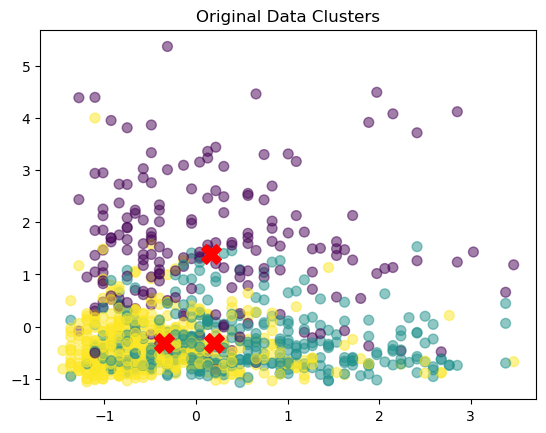

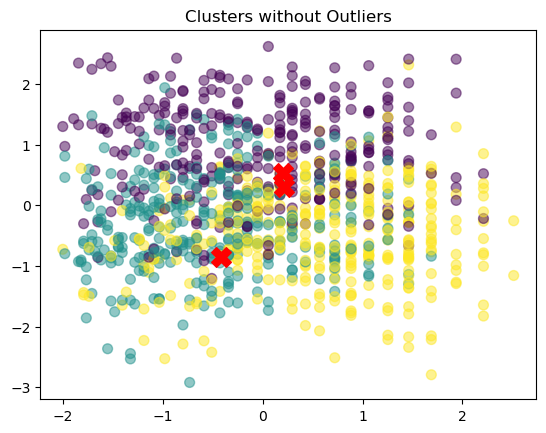

In [60]:
# metric evaluation
sse_transformed, sil_transformed, centers_transformed, y_pred_transformed = evaluate_kmeans(t_df_scaled, kmeans)
sse_outliers, sil_outliers, centers_outliers, y_pred_outliers = evaluate_kmeans(outliers_df_scaled, kmeans)

plot_clusters2d(outliers_df_scaled, 'Age in years', 'Credit amount', centers_outliers, y_pred_outliers, 'Original Data Clusters')
plot_clusters2d(t_df_scaled, 'T_Age in years', 'T_Credit amount', centers_transformed, y_pred_transformed, 'Clusters without Outliers')

In [61]:
print(f"With Outliers - SSE: {sse_outliers}, Silhouette Score: {sil_outliers}")
print(f"No Outliers - SSE: {sse_transformed}, Silhouette Score: {sil_transformed}")

With Outliers - SSE: 11544.604175902074, Silhouette Score: 0.10476425480103076
No Outliers - SSE: 11650.248540918381, Silhouette Score: 0.09321129772827814


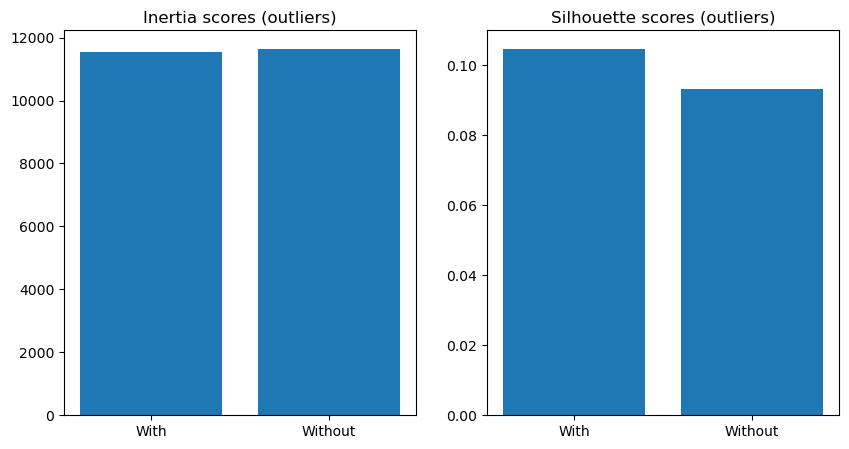

In [62]:
inertia_scores = [sse_outliers, sse_transformed]
silhouette_scores = [sil_outliers, sil_transformed]
labels = ['With', 'Without']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

ax1.bar(labels, inertia_scores)
ax1.set_title('Inertia scores (outliers)')

ax2.bar(labels, silhouette_scores)
ax2.set_title('Silhouette scores (outliers)')
plt.show()

_By keeping the outliers in the data, the SSE score stays closer to 0 and silhouette score closer to 1. This means that for this dataset at least, the presence of outliers is processed better by the K-means algorithm._

_We can also see from the 2D scatter plots that for the dataset containing outliers, the yellow cluster is better separated from the other 2 clusters than it is in the dataset without outliers._

In [63]:
# creating a copy of dataframe with outliers that is easier to reference
df_clustering = outliers_df_scaled.copy()

### 1.2.2 K-Means 1 - Financial Stability

In [64]:
df_clustering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Account Status                                            1000 non-null   float64
 1   Duration in month                                         1000 non-null   float64
 2   Credit History                                            1000 non-null   float64
 3   Credit amount                                             1000 non-null   float64
 4   Present employment since                                  1000 non-null   float64
 5   Instalment rate in percentage of disposable income        1000 non-null   float64
 6   Present residence since                                   1000 non-null   float64
 7   Age in years                                              1000 non-null   float64
 8   Other installment p

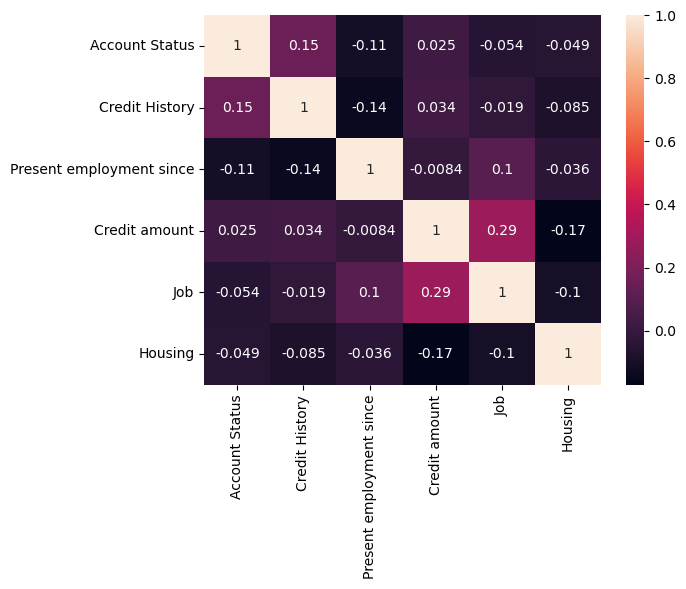

In [65]:
# subset data, containing at least 1 column with continuous values
df_subset_1 = df_clustering[['Account Status', 'Credit History', 'Present employment since', 
                             'Credit amount', 'Job', 'Housing']]

# making sure columns are not strongly correlated as it can negatively influence clustering
sns.heatmap(df_subset_1.corr(), annot=True)
plt.show()

Job column has a relatively strong correlation with Credit amount so I drop it.

In [66]:
df_subset_1 = df_subset_1.drop(columns = ['Job'])

#### 1.2.2.1 Pre-improvement Visualizing & Evaluation

In [67]:
sse1, sil1, centers_1, y_pred1 = evaluate_kmeans(df_subset_1, kmeans)

In [68]:
tsne_kmeans(df_subset_1, kmeans, 3, 1)

In [69]:
tsne_kmeans(df_subset_1, kmeans, 2, 1)

Clusters have bad cohesion, but cluster separation is somewhat decent as there are very few overlapping data points between the different clusters. Cluster centroids can also be easily estimated by looking at the visual.
No cluster has an overwhelming amount of data points.

In [70]:
print(f"SSE: {sse1}, Silhouette Score: {sil1}")

SSE: 3437.2274225229366, Silhouette Score: 0.20560080475076825


#### 1.2.2.2 Determining optimal number of clusters

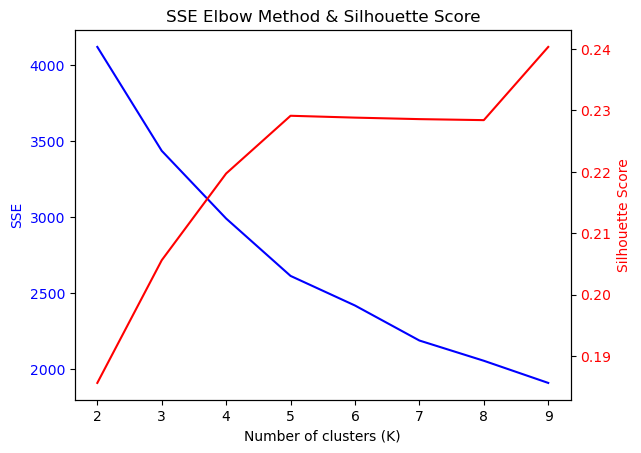

In [71]:
# calling function to help determine optimal number of clusters
find_optimal_clusters(df_subset_1, (2,10))

_From the chart above, it shows that as the number of clusters increase, the model performs better across the board metric-wise. However, I determined the optimal number of clusters to be 5 due to its balance between SSE, Silhouette score, and interpretability._

#### 1.2.2.3 Post-improvement Visualizing & Evaluation

In [72]:
kmeans1_improved = KMeans(n_clusters=5, n_init = 20, random_state = 1)
sse1_improved, sil1_improved, centers_1_improved, y_pred1_improved = evaluate_kmeans(df_subset_1, kmeans1_improved)

In [73]:
tsne_kmeans(df_subset_1, kmeans1_improved, 3, 1)

In [74]:
tsne_kmeans(df_subset_1, kmeans1_improved, 2, 1)

Metrics have improved.
While cohesion of clusters has improved slightly, they are still quite bad. Clusters are still well separated with the presence of overlap between 1 or 2 clusters. Cluster centroids can still be easily estimated by looking at the visual.
No cluster has an overwhelming amount of data points.


In [75]:
print(f"Improved SSE: {sse1_improved}, Improved Silhouette Score: {sil1_improved}")

Improved SSE: 2614.3356886639085, Improved Silhouette Score: 0.22912527931071952


### 1.2.3 KMeans 2 - Financial strain

In [76]:
df_clustering.head()

,Account Status,Duration in month,Credit History,Credit amount,Present employment since,Instalment rate in percentage of disposable income,Present residence since,Age in years,Other installment plans,Housing,Number of existing credits at this bank,Job,Number of people being liable to provide maintenance for,Target
0,-0.001045,-1.236478,-1.331622,-0.745131,1.338078,0.918477,1.046987,2.766456,-0.460831,0.585603,1.027079,0.146949,-0.428290,-0.654654
1,1.044372,2.248194,0.487534,0.949817,-0.317959,-0.870183,-0.765977,-1.191404,-0.460831,0.585603,-0.704926,0.146949,-0.428290,1.527525
2,-1.046463,-0.738668,-1.331622,-0.416562,0.510060,-0.870183,0.140505,1.183312,-0.460831,0.585603,-0.704926,-1.383771,2.334869,-0.654654
3,-0.001045,1.750384,0.487534,1.634247,0.510060,-0.870183,1.046987,0.831502,-0.460831,-2.379476,-0.704926,0.146949,2.334869,-0.654654
4,-0.001045,0.256953,-0.422044,0.566664,-0.317959,0.024147,1.046987,1.535122,-0.460831,-2.379476,1.027079,0.146949,2.334869,1.527525


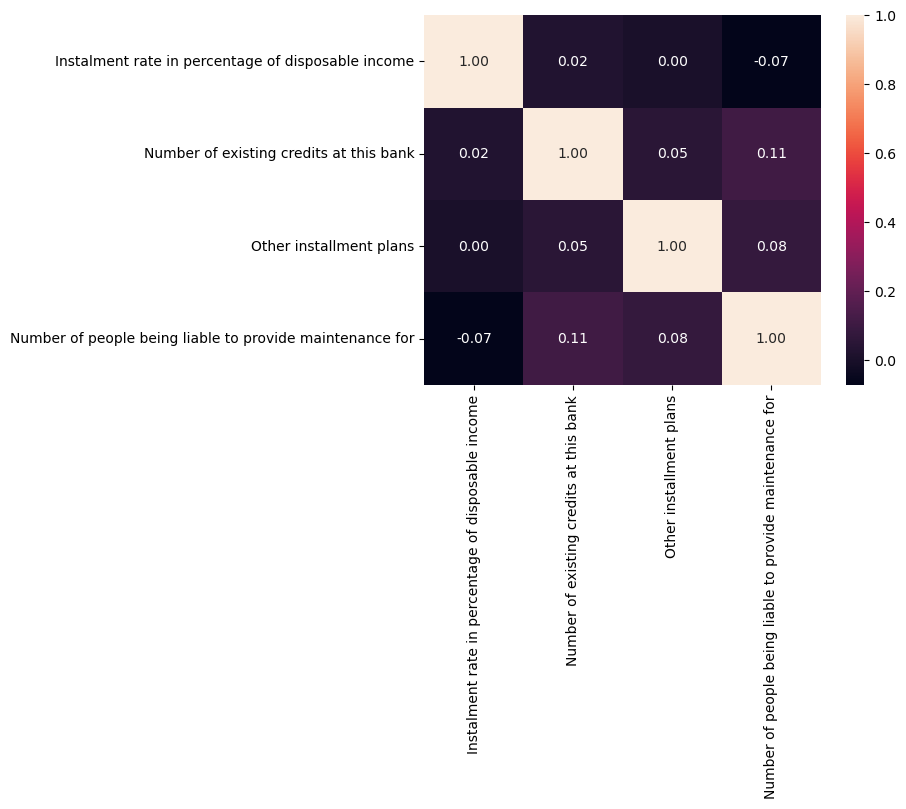

In [77]:
# subset data for Financial strain
df_subset_2 = df_clustering[['Instalment rate in percentage of disposable income', 'Number of existing credits at this bank',
                            'Other installment plans', 'Number of people being liable to provide maintenance for']]

# making sure columns are not strongly correlated as it can negatively influence clustering
sns.heatmap(df_subset_2.corr(), annot=True, fmt='.2f')
plt.show()

In [78]:
kmeans2 = KMeans(n_clusters=3, n_init=20, random_state = 1)

#### 1.2.3.1 Pre-improvement Visualizing & Evaluation

In [79]:
sse2, sil2, centers_2, y_pred2 = evaluate_kmeans(df_subset_2, kmeans2)

In [80]:
tsne_kmeans(df_subset_2, kmeans2, 3, 1)

In [81]:
tsne_kmeans(df_subset_2, kmeans2, 2, 1)

In [82]:
print(f"SSE: {sse2}, Silhouette Score: {sil2}")

SSE: 2249.4805065068917, Silhouette Score: 0.464871756640178


#### 1.2.3.2 Determining optimal number of clusters 

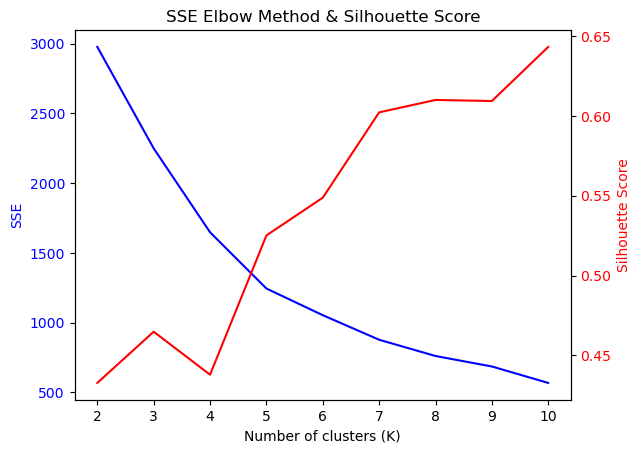

In [83]:
# calling function to help determine optimal number of clusters
find_optimal_clusters(df_subset_2, (2,11))

_From the chart above, it shows that as the number of clusters increase, the model performs better across the board metric-wise. However, I determined the optimal number of clusters to be 5 due to its balance between SSE, Silhouette score, and interpretability._

In [84]:
kmeans2_improved = KMeans(n_clusters=5, n_init=20, random_state = 1)
sse2_improved, sil2_improved, centers_2_improved, y_pred2_improved = evaluate_kmeans(df_subset_2, kmeans2_improved)

#### 1.2.3.3 Post-improvement Visualization & Evaluation

In [85]:
tsne_kmeans(df_subset_2, kmeans2_improved, 3, 1)

In [86]:
tsne_kmeans(df_subset_2, kmeans2_improved, 2, 1)

In [87]:
print(f"SSE: {sse2_improved}, Silhouette Score: {sil2_improved}")

SSE: 1244.5511863038655, Silhouette Score: 0.5251521681498241


## 1.3 Hierarchical Clustering

In [88]:
from sklearn.cluster import AgglomerativeClustering 
import scipy.cluster.hierarchy as shc 

##### Functions

In [89]:
def evaluate_agglo(data, ac):
    
    # initialize agglo, fit and predict on data
    y_pred = ac.fit_predict(data)   
    # store and retrive metrics and cluster centers
    sil_score = silhouette_score(data, y_pred)
    
    return sil_score, y_pred

In [90]:
def optimal_aggloClusters(data, cluster_range=(2,11)):
    silh = []
    
    for i in range(cluster_range[0], cluster_range[1]):
        ac = AgglomerativeClustering(n_clusters=i)
        y_pred = ac.fit_predict(data)
        silh.append(silhouette_score(data, y_pred))
        
    # Plotting Silhouette Scores using a bar graph to compare the results 
    plt.bar(range(cluster_range[0], cluster_range[1]), silh)
    plt.title('Silhouette score')
    plt.show() 

In [91]:
def plot_3d_scatter_ac(df, ac, x, y, z):
    # Create the scatter plot
    fig = go.Figure()

    # Add scatter points
    fig.add_trace(go.Scatter3d(
        x=df[x],
        y=df[y],
        z=df[z],
        mode='markers',
        marker=dict(
            size=5,
            color=ac.fit_predict(df),  # Color by y_pred
            colorscale='Viridis',  # Choose a colorscale
            opacity=0.8
        ),
        name='Data Points'
    ))

    # Update layout
    fig.update_layout(
        title='Interactive 3D Scatter Plot',
        scene=dict(
            xaxis_title=f'{x}',
            yaxis_title=f'{y}',
            zaxis_title=f'{z}'
        )
    )

    # Show plot
    fig.show()

In [92]:
def tsne_ac(df, ac, tsne_components=3, random_state=1):
    """
    Perform agglomerative clustering, apply t-SNE for dimensionality reduction,
    and create a 3D scatter plot of the results.
    
    Parameters:
    - df: DataFrame, the input data for clustering
    - n_clusters: int, the number of clusters for agglomerative clustering
    - tsne_components: int, the number of dimensions for t-SNE (2 or 3)
    - random_state: int, random seed for reproducibility
    
    Returns:
    - fig: plotly.graph_objs._figure.Figure, the 3D scatter plot figure
    """
    # Perform Agglomerative Clustering
    labels = ac.fit_predict(df)
    
    # Apply t-SNE for dimensionality reduction
    tsne = TSNE(n_components=tsne_components, random_state=random_state)
    tsne_results = tsne.fit_transform(df)
    
    # Create a DataFrame for the t-SNE results
    tsne_columns = [f'TSNE{i+1}' for i in range(tsne_components)]
    df_tsne = pd.DataFrame(tsne_results, columns=tsne_columns)
    df_tsne['Cluster'] = labels
    
    # Create a 3D scatter plot
    if tsne_components == 3:
        fig = px.scatter_3d(df_tsne, x='TSNE1', y='TSNE2', z='TSNE3', color='Cluster', symbol='Cluster')
        fig.update_layout(title='3D Scatter Plot of t-SNE with Agglomerative Clustering')
    elif tsne_components == 2:
        fig = px.scatter(df_tsne, x='TSNE1', y='TSNE2', color='Cluster', symbol='Cluster')
        fig.update_layout(title='2D Scatter Plot of t-SNE with Agglomerative Clustering')
    else:
        raise ValueError("tsne_components must be 2 or 3")
    
    return fig

In [93]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

def plot_silhouette(X, agglomerative_clustering, n_clusters_range):
    """
    Plot silhouette plot for hierarchical clustering with different number of clusters.

    Parameters:
    X (array-like): The data to be clustered.
    agglomerative_clustering (AgglomerativeClustering): AgglomerativeClustering object with parameters set.
    n_clusters_range (list or range): Range of number of clusters to try.

    Returns:
    None (displays the plot)
    """
    silhouette_avg_scores = []

    for n_clusters in n_clusters_range:
        # Set the number of clusters
        agglomerative_clustering.set_params(n_clusters=n_clusters)

        # Perform hierarchical clustering
        cluster_labels = agglomerative_clustering.fit_predict(X)

        # Compute silhouette scores
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_avg_scores.append(silhouette_avg)
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        # Plot silhouette plot
        plt.figure(figsize=(30, 10))
        plt.subplot(1, len(n_clusters_range), n_clusters_range.index(n_clusters) + 1)
        plt.title('Number of clusters = {}'.format(n_clusters))
        plt.xlabel("Silhouette Coefficients")
        plt.ylabel("Cluster label")
        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.nipy_spectral(float(i) / n_clusters)
            plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        
    plt.tight_layout()
    plt.show()

_I will use the same features to fit my hierarchical clustering models on so that there can be fair comparison of metrics between KMeans and Hierarchical clustering._

### 1.3.1 Agglomerative Clustering - Financial Stability

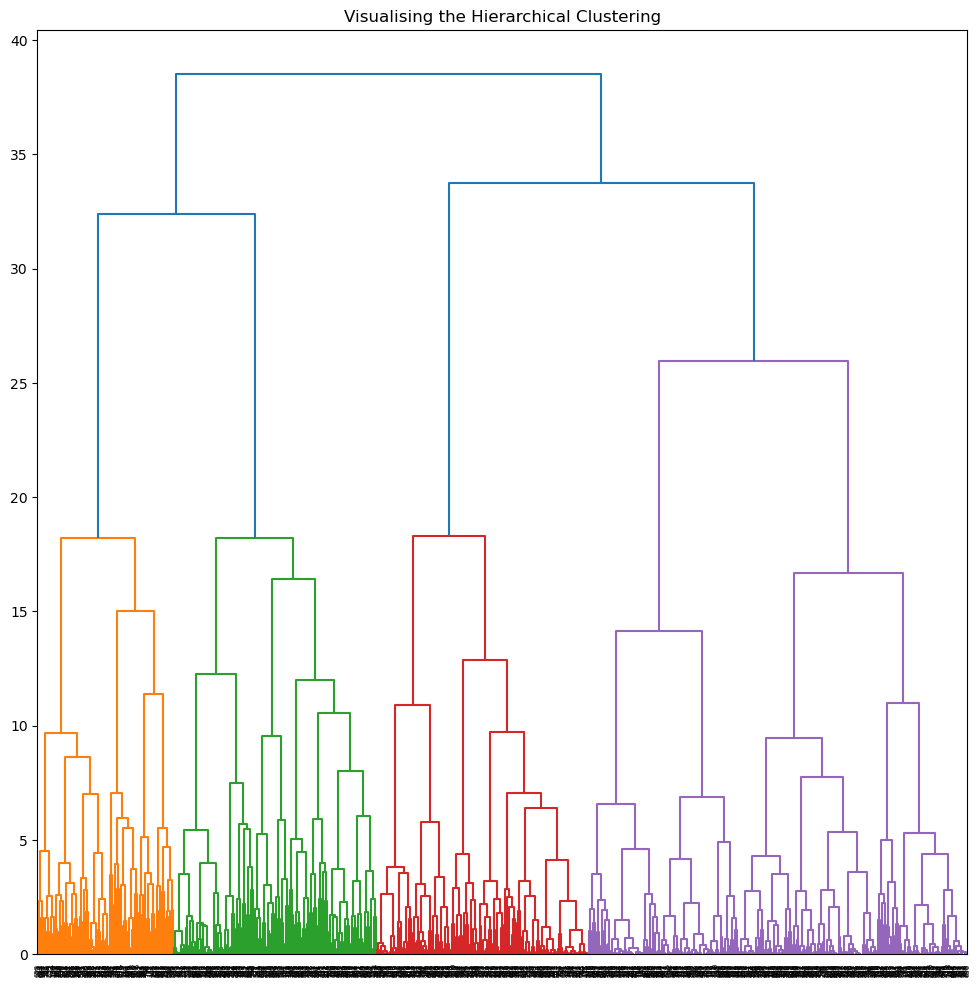

In [94]:
Z = shc.linkage(df_subset_1, method ='ward')

# Visualizing the hierarchical clustering through Dendrograms
plt.figure(figsize =(12, 12)) 
plt.title('Visualising the Hierarchical Clustering') 
Dendrogram = shc.dendrogram(Z)

From this chart, it appears that 5 clusters is a good number to start from.

In [95]:
ac1 = AgglomerativeClustering(n_clusters=5)

#### 1.3.1.1 Pre-improvement Visualization & Evaluation

In [96]:
ac_sil1, y_pred1 = evaluate_agglo(df_subset_1, ac1)
print(f'Agglo Silhouette score: {ac_sil1}')

Agglo Silhouette score: 0.1754836352133269


In [97]:
tsne_ac(df_subset_1, ac1, 3, 1)

In [98]:
tsne_ac(df_subset_1, ac1, 2, 1)

#### 1.3.1.2 Determining optimal number of clusters

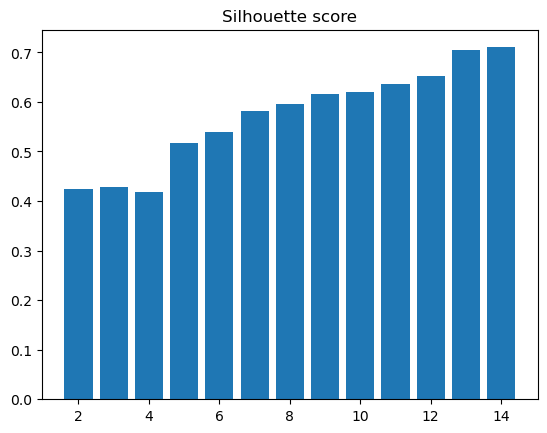

In [99]:
optimal_aggloClusters(df_subset_2, (2,15))

The chart above tells us that 4 clusters will maximize silhouette score and interpretability.

In [100]:
ac1_improved = AgglomerativeClustering(n_clusters=4)

#### 1.3.1.3 Post-improvement Visualization & Evaluation

In [101]:
tsne_ac(df_subset_1, ac1_improved, 3, 1)

In [102]:
tsne_ac(df_subset_1, ac1_improved, 2, 1)

In [103]:
ac_sil1_improved, ac_y_pred1_improved = evaluate_agglo(df_subset_1, ac1_improved)
print(f'Original Silhouette score: {ac_sil1}')
print(f'Improved Silhouette score: {ac_sil1_improved}')

Original Silhouette score: 0.1754836352133269
Improved Silhouette score: 0.1961902281235194


### 1.3.2 Agglomerative Clustering - Financial Strain

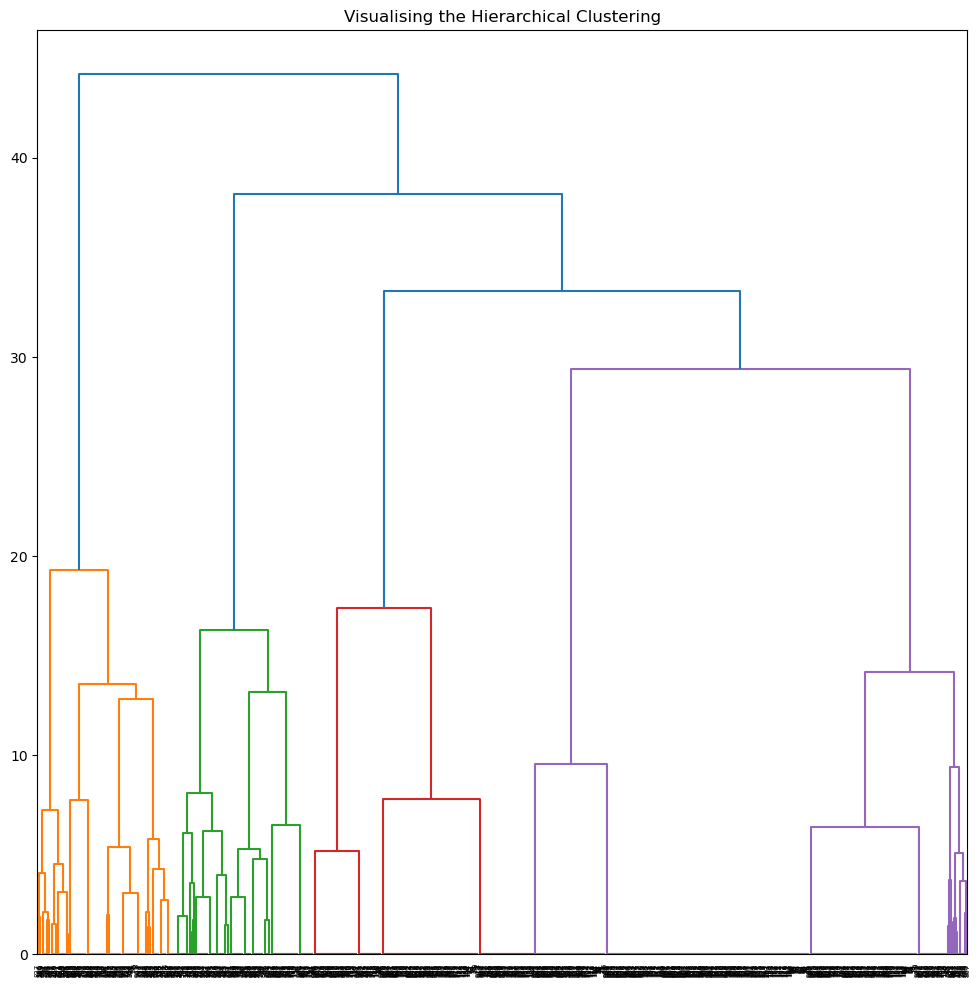

In [104]:
Z = shc.linkage(df_subset_2, method ='ward')

# Visualizing the hierarchical clustering through Dendrograms
plt.figure(figsize =(12, 12)) 
plt.title('Visualising the Hierarchical Clustering') 
Dendrogram = shc.dendrogram(Z)

From the chart, it appears a good start would be 5 clusters.

In [105]:
ac2 = AgglomerativeClustering(n_clusters=5)

#### 1.3.2.1 Pre-improvement Visualization & Evaluation

In [106]:
ac_sil2, y_pred2 = evaluate_agglo(df_subset_2, ac2)
print(f'Agglo Silhouette score: {ac_sil2}')

Agglo Silhouette score: 0.5166323485757505


In [107]:
tsne_ac(df_subset_2, ac2, 3, 1)

In [108]:
tsne_ac(df_subset_2, ac2, 2, 1)

#### 1.3.2.2 Determining optimal number of clusters

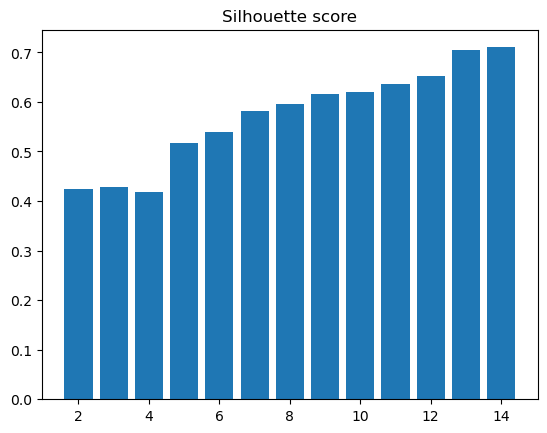

In [109]:
optimal_aggloClusters(df_subset_2, (2,15))

I decided to stick with 5 clusters to maximize silhouette score and interpretability.

#### 1.3.2.3 Post-improvement Visualization & Evaluation

In [110]:
ac2_improved = AgglomerativeClustering(n_clusters=3)

In [111]:
ac_sil2_improved, ac_y_pred2_improved = evaluate_agglo(df_subset_2, ac2_improved)
print(f'Agglo Silhouette score: {ac_sil2_improved}')

Agglo Silhouette score: 0.42787819045543257


In [112]:
tsne_ac(df_subset_2, ac2_improved, 3, 1)

In [113]:
tsne_ac(df_subset_2, ac2_improved, 2, 1)

## 1.4 Comparison of clustering models

### 1.4.1 Silhouette score comparison

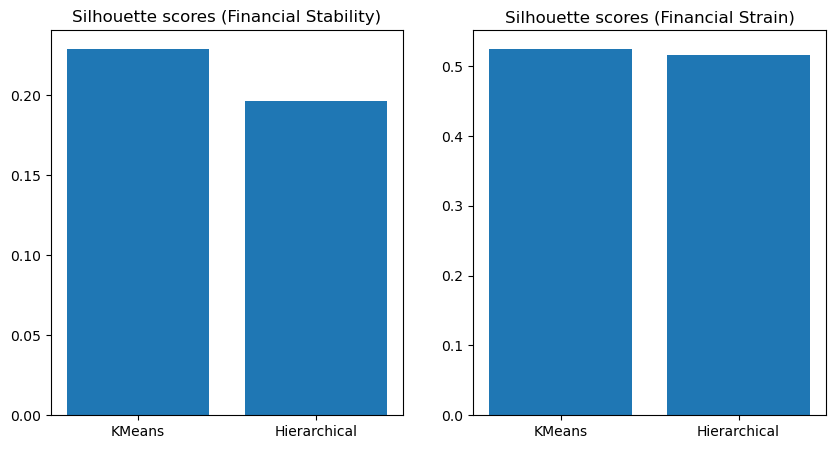

In [114]:
stability_scores = [sil1_improved, ac_sil1_improved]
strain_scores = [sil2_improved, ac_sil2]
models = ['KMeans', 'Hierarchical']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

ax1.bar(models, stability_scores)
ax1.set_title('Silhouette scores (Financial Stability)')

ax2.bar(models, strain_scores)
ax2.set_title('Silhouette scores (Financial Strain)')
plt.show()

From both charts, we can tell that in both cases KMeans clustering outperforms Hierarchical clustering in terms of Silhouette score for themes of Financial Stability and Financial Strain. Hence, I will be further exploring the KMeans model for both themes.

I will also join columns that represent demographic data from the original dataframe for further interpretation. (Age in years & Purpose)

### 1.4.2 Financial Stability KMeans

In [115]:
kmeans1_improved

KMeans(n_clusters=5, n_init=20, random_state=1)

In [116]:
df_subset_1['Age in years'] = df['Age in years']
df_subset_1['Purpose_group'] = df['Purpose_group']
df_subset_1['Cluster'] = y_pred1_improved

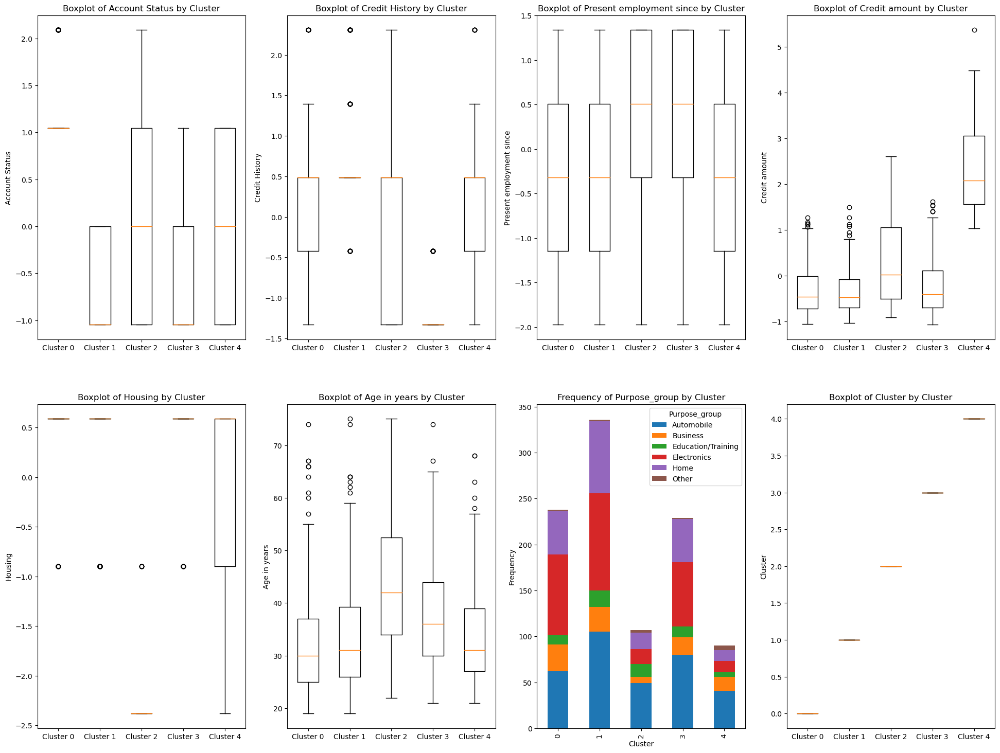

In [117]:
# Assuming df_subset_1 is already defined and contains the data
# Let's define the number of rows and columns for the grid
n_rows = 2
n_cols = 4

# Create a figure and axes with the specified grid size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 18))
axes = axes.flatten()

# Iterate over each column and plot the appropriate plot on the corresponding axis
for idx, col in enumerate(df_subset_1.columns):
    ax = axes[idx]
    if np.issubdtype(df_subset_1[col].dtype, np.number):
        # Plot boxplot for numerical columns
        ax.boxplot([
            df_subset_1[col][df_subset_1.Cluster == 0].tolist(),
            df_subset_1[col][df_subset_1.Cluster == 1].tolist(),
            df_subset_1[col][df_subset_1.Cluster == 2].tolist(),
            df_subset_1[col][df_subset_1.Cluster == 3].tolist(),
            df_subset_1[col][df_subset_1.Cluster == 4].tolist(),
        ], labels=('Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'))
        ax.set_ylabel(col)
        ax.set_title(f'Boxplot of {col} by Cluster')
    else:
        # Plot bar plot for categorical columns
        counts = df_subset_1.groupby(['Cluster', col]).size().unstack(fill_value=0)
        counts.plot(kind='bar', stacked=True, ax=ax)
        ax.set_title(f'Frequency of {col} by Cluster')
        ax.set_xlabel('Cluster')
        ax.set_ylabel('Frequency')

# Hide any remaining empty subplots
for i in range(len(df_subset_1.columns), n_rows * n_cols):
    fig.delaxes(axes[i])

plt.show()

### 1.4.3 Financial Burden K-Means

In [118]:
kmeans2_improved

KMeans(n_clusters=5, n_init=20, random_state=1)

In [119]:
df_subset_2['Age in years'] = df['Age in years']
df_subset_2['Purpose_group'] = df['Purpose_group']
df_subset_2['Cluster'] = y_pred2_improved

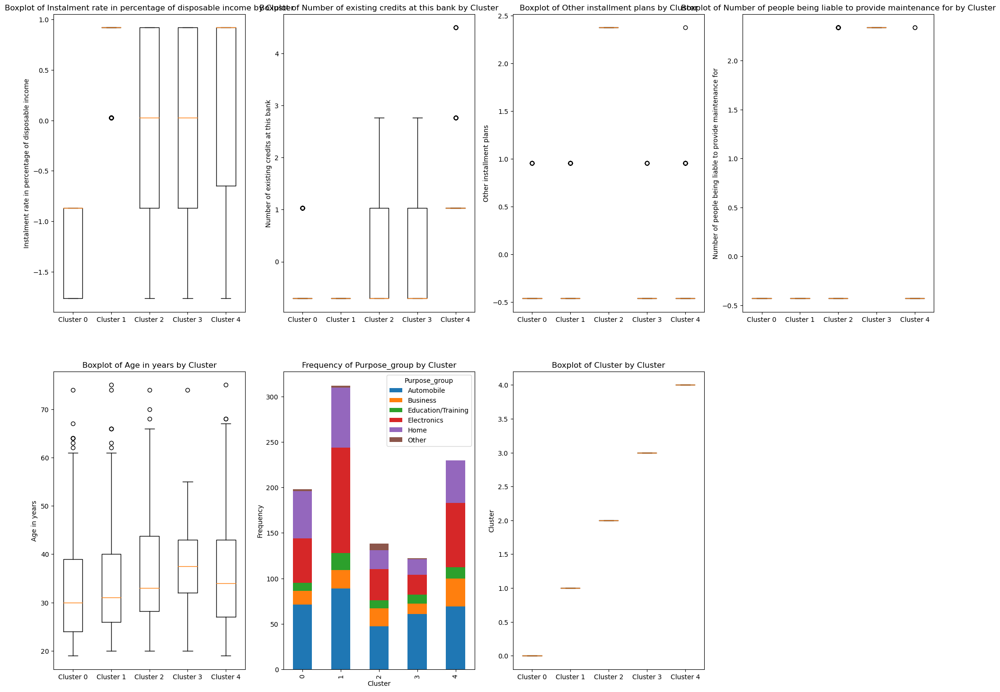

In [120]:
# Assuming df_subset_2 is already defined and contains the data
# Let's define the number of rows and columns for the grid
n_rows = 2
n_cols = 4

# Create a figure and axes with the specified grid size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 18))
axes = axes.flatten()

# Iterate over each column and plot the appropriate plot on the corresponding axis
for idx, col in enumerate(df_subset_2.columns):
    ax = axes[idx]
    if np.issubdtype(df_subset_2[col].dtype, np.number):
        # Plot boxplot for numerical columns
        ax.boxplot([
            df_subset_2[col][df_subset_2.Cluster == 0].tolist(),
            df_subset_2[col][df_subset_2.Cluster == 1].tolist(),
            df_subset_2[col][df_subset_2.Cluster == 2].tolist(),
            df_subset_2[col][df_subset_2.Cluster == 3].tolist(),
            df_subset_2[col][df_subset_2.Cluster == 4].tolist(),
        ], labels=('Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'))
        ax.set_ylabel(col)
        ax.set_title(f'Boxplot of {col} by Cluster')
    else:
        # Plot bar plot for categorical columns
        counts = df_subset_2.groupby(['Cluster', col]).size().unstack(fill_value=0)
        counts.plot(kind='bar', stacked=True, ax=ax)
        ax.set_title(f'Frequency of {col} by Cluster')
        ax.set_xlabel('Cluster')
        ax.set_ylabel('Frequency')

# Hide any remaining empty subplots
for i in range(len(df_subset_2.columns), n_rows * n_cols):
    fig.delaxes(axes[i])

plt.show()